# Final - Project

# Analysis of Statistical Inference Methods vs Traditional ML 

### Submitted by:
#### Name      : Muhammad Amin Ghias
#### ERP ID    : 25366

Date : 31st January 2022

# Analysis on Datasets for Regression

# Regression Dataset #2

# Importing Libraraies

In [1]:
import pandas as pd
import pymc3 as pm
import numpy as np
import theano.tensor as tt
import matplotlib.pyplot as plt

# %matplotlib inline
import arviz as az
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import graphviz
import os


WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:


import lazypredict
from lazypredict.Supervised import LazyRegressor

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# To display all the columns of dataframe
pd.set_option('display.max_columns', 500)
import warnings
warnings.filterwarnings("ignore")

from sklearn import preprocessing

import matplotlib.pyplot as plt

import seaborn as sns

from scipy.stats import skew
from scipy.stats import kurtosis

from sklearn.feature_selection import mutual_info_classif

from sklearn.feature_selection import mutual_info_regression

from sklearn.decomposition import PCA

import time

from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline


import warnings 
warnings.filterwarnings('ignore')


from sklearn.preprocessing import LabelEncoder

import time


from numpy import mean



from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
# import statsmodels.api as sm
from sklearn.feature_selection import SequentialFeatureSelector
import os

import matplotlib
import seaborn as sns

import plotly.express as px

from sklearn.preprocessing import PolynomialFeatures

from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from numpy import arange
from sklearn.linear_model import LassoCV
import warnings 
warnings.filterwarnings('ignore')

from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from sklearn.feature_selection import SequentialFeatureSelector

from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor


from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score




cv = KFold(n_splits=10, random_state=1, shuffle=True)
# reg = LinearRegression()


from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score


from numpy.random import normal
from numpy.random import exponential
import random
import re

import plotly.express as px
import plotly.graph_objects as go

from sklearn.feature_selection import mutual_info_regression

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
pd.set_option('display.max_columns', 500)


## Getting Dataeset

In [3]:
df=pd.read_csv('Bias_correction_ucl.csv')
print(df.shape)
df.head()

(7752, 25)


,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.00,2013-06-30,28.70,21.40,58.26,91.12,28.07,23.01,6.82,69.45,0.23,0.20,0.16,0.13,0.00,0.00,0.00,0.00,37.60,126.99,212.34,2.79,5992.90,29.10,21.20
1,2.00,2013-06-30,31.90,21.60,52.26,90.60,29.85,24.04,5.69,51.94,0.23,0.25,0.16,0.13,0.00,0.00,0.00,0.00,37.60,127.03,44.76,0.51,5869.31,30.50,22.50
2,3.00,2013-06-30,31.60,23.30,48.69,83.97,30.09,24.57,6.14,20.57,0.21,0.26,0.20,0.14,0.00,0.00,0.00,0.00,37.58,127.06,33.31,0.27,5863.56,31.10,23.90
3,4.00,2013-06-30,32.00,23.40,58.24,96.48,29.70,23.33,5.65,65.73,0.22,0.23,0.16,0.13,0.00,0.00,0.00,0.00,37.65,127.02,45.72,2.53,5856.96,31.70,24.30
4,5.00,2013-06-30,31.40,21.90,56.17,90.16,29.11,23.49,5.74,107.97,0.15,0.25,0.18,0.17,0.00,0.00,0.00,0.00,37.55,127.14,35.04,0.51,5859.55,31.20,22.50


In [4]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.00,2017-08-30,23.30,17.10,26.74,78.87,26.35,18.78,6.15,72.06,0.03,0.08,0.00,0.00,0.00,0.00,0.00,0.00,37.54,126.89,15.59,0.16,4443.31,28.30,18.10
7748,24.00,2017-08-30,23.30,17.70,24.04,77.29,27.01,18.73,6.54,47.24,0.04,0.07,0.00,0.00,0.00,0.00,0.00,0.00,37.52,126.91,17.30,0.22,4438.37,28.60,18.80
7749,25.00,2017-08-30,23.20,17.40,22.93,77.24,27.94,18.52,7.29,9.09,0.05,0.06,0.00,0.00,0.00,0.00,0.00,0.00,37.52,126.97,19.58,0.27,4451.35,27.80,17.40
7750,NaN,NaN,20.00,11.30,19.79,58.94,17.62,14.27,2.88,-13.60,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,37.46,126.83,12.37,0.10,4329.52,17.40,11.30
7751,NaN,NaN,37.60,29.90,98.52,100.00,38.54,29.62,21.86,213.41,0.97,0.97,0.98,0.97,23.70,21.62,15.84,16.66,37.65,127.14,212.34,5.18,5992.90,38.90,29.80


In [5]:
df_c=df.copy()

### Data set details

## Dataset Title: 
## Bias correction of numerical prediction model temperature forecast Data Set


This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

The data was obtained from UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Bias+correction+of+numerical+prediction+model+temperature+forecast





#### Attribute Information:

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8

## EDA

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [7]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.00,7682.00,7682.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7677.00,7752.00,7752.00,7752.00,7752.00,7752.00,7725.00,7725.00
mean,13.00,29.77,23.23,56.76,88.37,29.61,23.51,7.10,62.51,0.37,0.36,0.32,0.30,0.59,0.49,0.28,0.27,37.54,126.99,61.87,1.26,5341.50,30.27,22.93
std,7.21,2.97,2.41,14.67,7.19,2.95,2.35,2.18,33.73,0.26,0.26,0.25,0.25,1.95,1.76,1.16,1.21,0.05,0.08,54.28,1.37,429.16,3.13,2.49
min,1.00,20.00,11.30,19.79,58.94,17.62,14.27,2.88,-13.60,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,37.46,126.83,12.37,0.10,4329.52,17.40,11.30
25%,7.00,27.80,21.70,45.96,84.22,27.67,22.09,5.68,37.27,0.15,0.14,0.10,0.08,0.00,0.00,0.00,0.00,37.51,126.94,28.70,0.27,4999.02,28.20,21.30
50%,13.00,29.90,23.40,55.04,89.79,29.70,23.76,6.55,56.87,0.32,0.31,0.26,0.23,0.00,0.00,0.00,0.00,37.55,127.00,45.72,0.62,5436.35,30.50,23.10
75%,19.00,32.00,24.90,67.19,93.74,31.71,25.15,8.03,84.22,0.58,0.56,0.50,0.50,0.05,0.02,0.01,0.00,37.58,127.04,59.83,1.77,5728.32,32.60,24.60
max,25.00,37.60,29.90,98.52,100.00,38.54,29.62,21.86,213.41,0.97,0.97,0.98,0.97,23.70,21.62,15.84,16.66,37.65,127.14,212.34,5.18,5992.90,38.90,29.80


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

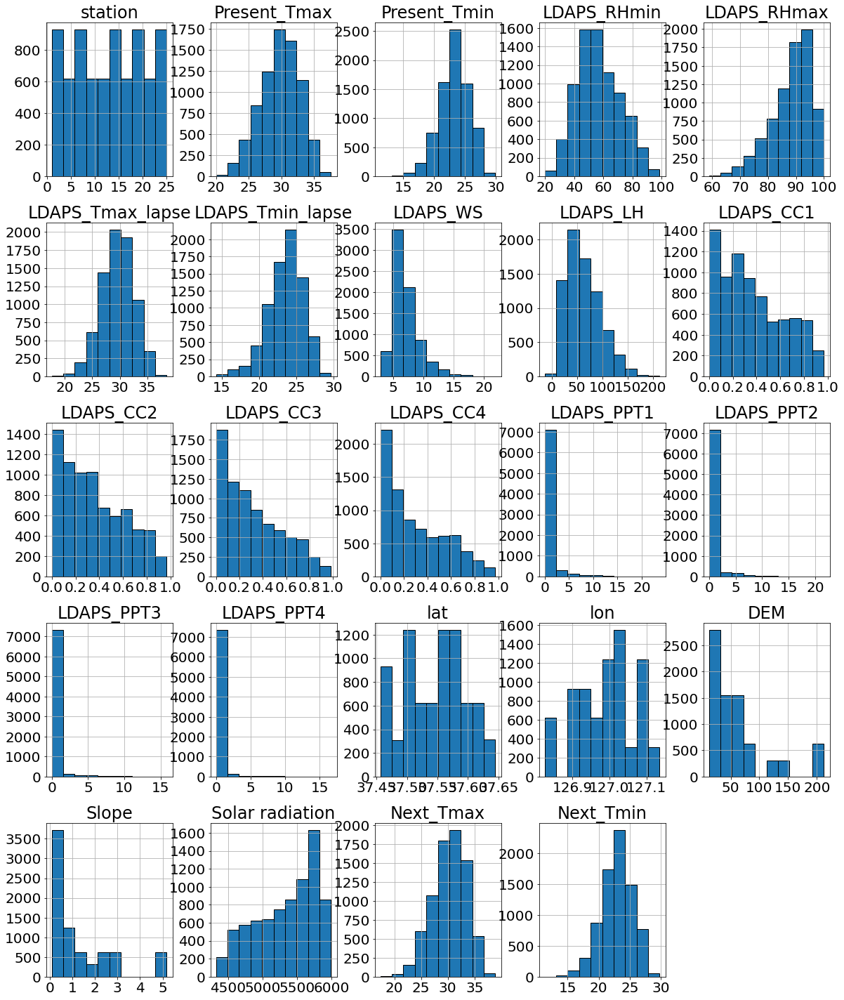

In [8]:
%matplotlib inline
# fig = plt.figure(figsize = (20,25))
# ax = fig.gca()
# df.hist(ax=ax)

fig= df.hist(xlabelsize=20,ylabelsize=20,ec="k",figsize=(20,25))
[x.title.set_size(24) for x in fig.ravel()]


All the features are highly skewed

In [9]:
df.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

#### Dropping the NaN values

In [10]:
print(df.shape)
df=df.dropna()
df.shape

(7752, 25)


(7588, 25)

In [11]:
df=df.drop(columns=['Date'])

### Applying log transformation with add 1 to make the dataset distributions more towards normal distribution and rescale the features within range and resuces the skewness from the dataset

### Applying standard Scaling

In [12]:

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X2_Scaled = scaler.fit_transform(df)
df_scaled = pd.DataFrame(X2_Scaled)
df_scaled.columns = df.columns


In [13]:
df_log=np.log1p(df)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

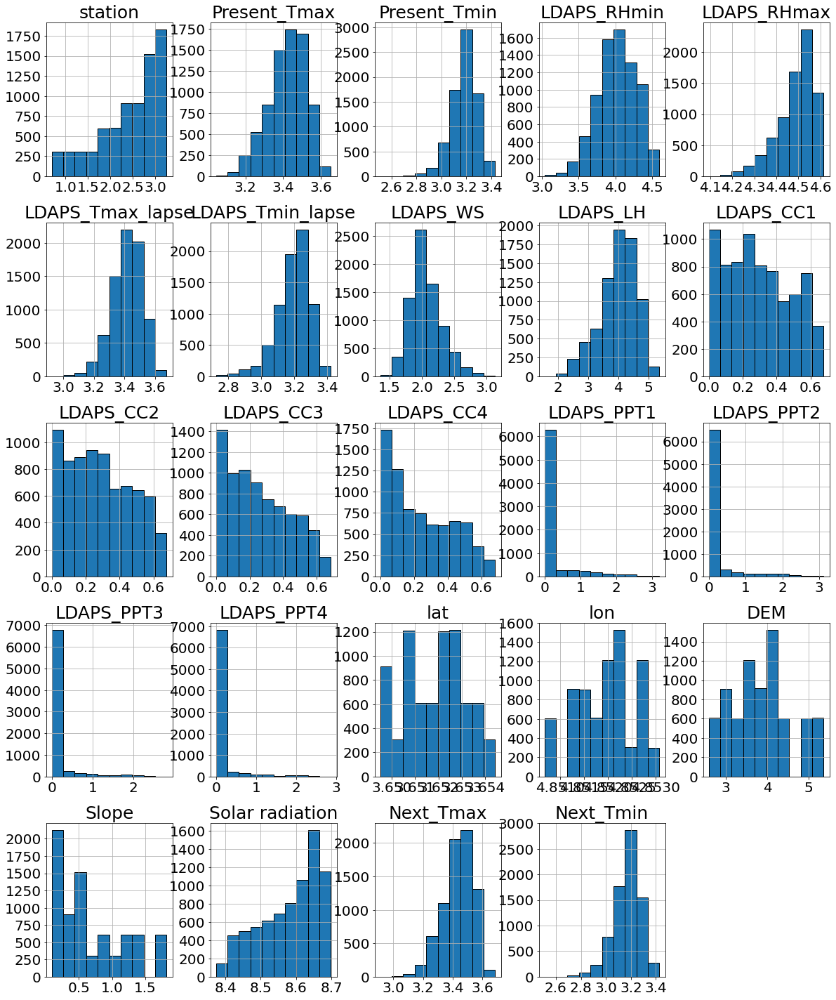

In [14]:
%matplotlib inline


fig= df_log.hist(xlabelsize=20,ylabelsize=20,ec="k",figsize=(20,25))
[x.title.set_size(25) for x in fig.ravel()]


after applying log transformation the features have become more normally distributed

#### We will do further all analysis on this dataset with logtransformation

## Correlation

In [15]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.00,0.11,0.13,-0.07,-0.17,0.07,0.11,0.01,-0.13,0.01,0.00,-0.00,0.01,-0.00,-0.01,-0.01,-0.01,-0.24,-0.12,-0.26,-0.09,-0.02,0.11,0.13
Present_Tmax,0.11,1.00,0.62,-0.21,-0.31,0.57,0.63,-0.13,0.13,-0.32,-0.22,-0.15,-0.14,-0.11,-0.10,-0.13,-0.11,-0.05,0.01,-0.19,-0.11,-0.02,0.61,0.62
Present_Tmin,0.13,0.62,1.00,0.12,-0.02,0.47,0.77,-0.04,-0.01,0.08,0.09,-0.00,-0.05,0.11,0.07,-0.05,-0.07,-0.08,-0.05,-0.25,-0.15,0.06,0.46,0.80
LDAPS_RHmin,-0.07,-0.21,0.12,1.00,0.58,-0.57,0.09,0.29,-0.07,0.61,0.74,0.69,0.51,0.26,0.39,0.24,0.17,0.09,-0.08,0.10,0.12,0.24,-0.45,0.09
LDAPS_RHmax,-0.17,-0.31,-0.02,0.58,1.00,-0.38,-0.12,0.13,0.24,0.44,0.39,0.22,0.13,0.27,0.23,0.13,0.12,0.19,0.03,0.18,0.22,0.15,-0.29,-0.08
LDAPS_Tmax_lapse,0.07,0.57,0.47,-0.57,-0.38,1.00,0.65,-0.32,0.04,-0.44,-0.53,-0.54,-0.43,-0.12,-0.25,-0.19,-0.17,-0.04,0.09,-0.18,-0.16,0.05,0.84,0.59
LDAPS_Tmin_lapse,0.11,0.63,0.77,0.09,-0.12,0.65,1.00,-0.13,-0.14,0.01,0.05,-0.04,-0.08,0.03,-0.00,-0.09,-0.10,-0.10,-0.02,-0.20,-0.19,0.16,0.59,0.89
LDAPS_WS,0.01,-0.13,-0.04,0.29,0.13,-0.32,-0.13,1.00,0.00,0.29,0.26,0.24,0.22,0.14,0.18,0.15,0.13,0.03,-0.06,0.19,0.17,0.12,-0.35,-0.10
LDAPS_LH,-0.13,0.13,-0.01,-0.07,0.24,0.04,-0.14,0.00,1.00,-0.15,-0.27,-0.25,-0.17,-0.02,-0.08,0.01,0.01,0.13,0.02,0.06,0.09,-0.04,0.16,-0.06
LDAPS_CC1,0.01,-0.32,0.08,0.61,0.44,-0.44,0.01,0.29,-0.15,1.00,0.78,0.52,0.36,0.45,0.39,0.17,0.09,-0.01,-0.01,-0.02,-0.02,0.22,-0.46,-0.01


## Correlation heatmap

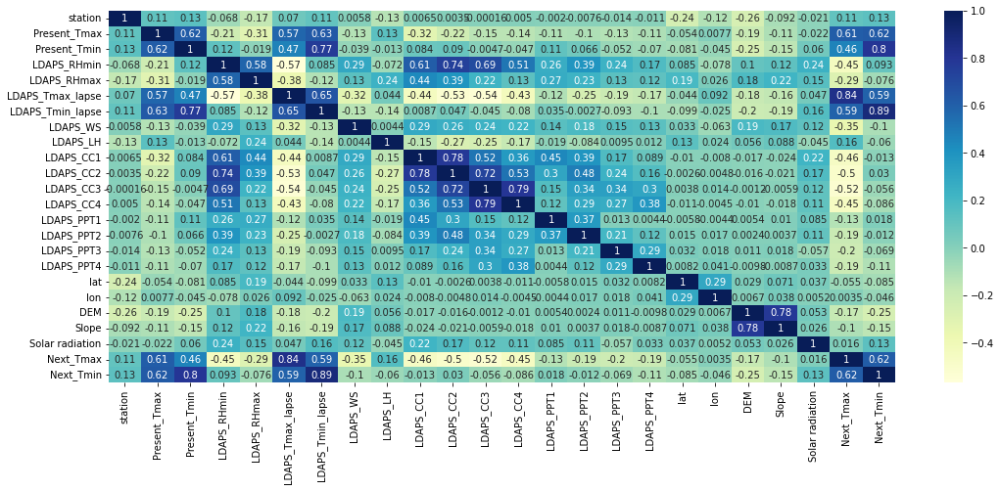

In [16]:
cor=df.corr()
plt.figure(figsize=(18, 7))
dataplot = sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

##### There is some correlation between features as seen above

## Feature Selection

In [17]:
df_log.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [18]:
df_log.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7585.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00
mean,2.45,3.42,3.18,4.02,4.49,3.42,3.19,2.06,3.99,0.30,0.29,0.26,0.24,0.23,0.18,0.12,0.11,3.65,4.85,3.85,0.67,8.58,3.44,3.17
std,0.69,0.10,0.10,0.26,0.08,0.10,0.10,0.24,0.61,0.19,0.19,0.18,0.19,0.53,0.49,0.37,0.37,0.00,0.00,0.73,0.50,0.08,0.10,0.11
min,0.69,3.04,2.51,3.03,4.09,2.92,2.73,1.36,1.55,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.65,4.85,2.59,0.09,8.37,2.91,2.51
25%,2.08,3.36,3.12,3.85,4.45,3.36,3.14,1.90,3.64,0.14,0.13,0.10,0.08,0.00,0.00,0.00,0.00,3.65,4.85,3.39,0.24,8.52,3.37,3.10
50%,2.64,3.43,3.19,4.03,4.51,3.42,3.21,2.02,4.06,0.27,0.27,0.23,0.20,0.00,0.00,0.00,0.00,3.65,4.85,3.84,0.48,8.60,3.45,3.18
75%,3.00,3.50,3.25,4.22,4.55,3.49,3.26,2.20,4.45,0.45,0.44,0.40,0.40,0.05,0.02,0.01,0.00,3.65,4.85,4.11,1.02,8.65,3.51,3.24
max,3.26,3.65,3.43,4.60,4.62,3.68,3.42,3.13,5.37,0.68,0.68,0.69,0.68,3.21,3.12,2.82,2.87,3.65,4.85,5.36,1.82,8.70,3.69,3.43


In [19]:
df.isna().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

### for df_scaled

In [20]:
dfs = pd.DataFrame()

X=df_scaled.drop(columns=['Next_Tmax', 'Next_Tmin'])
y=df_scaled['Next_Tmax']

trainX=X
trainy=y
testX=X
testy=y

discrete_features = X.dtypes == int


mi_scores_d = mutual_info_regression(trainX, trainy, discrete_features=discrete_features)
    
mi_scores_d = pd.Series(mi_scores_d, name="MI Scores", index=trainX.columns)


dfs['MI']=mi_scores_d

## Feature selection using random forrest and gradient boosting

clfRF = RandomForestRegressor(max_depth=5, max_features=4, min_samples_split=8,
                  n_estimators=100)#, random_state=0)
clfRF.fit(trainX, trainy)
importance_rf = pd.Series(clfRF.feature_importances_, index=trainX.columns)


clfGB = GradientBoostingRegressor(max_depth=2,n_estimators=50)#, random_state=0)
clfGB.fit(trainX, trainy)
importance_GB = pd.Series(clfGB.feature_importances_, index=trainX.columns)


clfdt = DecisionTreeRegressor(max_depth=5)
clfdt.fit(trainX, trainy)
importance_dt = pd.Series(clfdt.feature_importances_, index=trainX.columns)

cor=df_scaled.corr()


cor_target = abs(cor['Next_Tmax'])

cor_target = pd.Series(cor_target, name="Correlation", index=trainX.columns)


dfs['Decission_Tree']=importance_dt

dfs['Random_Forrest']=importance_rf

dfs['Gradient_Boosting']=importance_GB

dfs['Correlation_Default']=cor_target

dfs['sum']=dfs.sum(axis=1)

dfs.sort_values('sum',ascending=False)


,MI,Decission_Tree,Random_Forrest,Gradient_Boosting,Correlation_Default,sum
LDAPS_Tmax_lapse,0.63,0.88,0.35,0.79,0.84,3.48
Present_Tmax,0.30,0.05,0.13,0.09,0.61,1.17
LDAPS_Tmin_lapse,0.27,0.01,0.11,0.01,0.59,1.00
LDAPS_CC3,0.22,0.02,0.09,0.03,0.52,0.88
LDAPS_CC2,0.21,0.00,0.04,0.00,0.50,0.76
LDAPS_CC1,0.19,0.02,0.04,0.02,0.46,0.74
LDAPS_CC4,0.18,0.00,0.04,0.02,0.45,0.70
Present_Tmin,0.17,0.00,0.04,0.00,0.46,0.68
LDAPS_RHmin,0.15,0.00,0.04,0.00,0.45,0.64
LDAPS_WS,0.14,0.01,0.02,0.02,0.35,0.54


### for df

In [21]:
dfs = pd.DataFrame()

X=df.drop(columns=['Next_Tmax', 'Next_Tmin'])
y=df['Next_Tmax']

trainX=X
trainy=y
testX=X
testy=y

discrete_features = X.dtypes == int


mi_scores_d = mutual_info_regression(trainX, trainy, discrete_features=discrete_features)
    
mi_scores_d = pd.Series(mi_scores_d, name="MI Scores", index=trainX.columns)
# mi_scores_d = mi_scores_d.sort_values(ascending=False)
# mi_scores_d

dfs['MI']=mi_scores_d

## Feature selection using random forrest and gradient boosting

clfRF = RandomForestRegressor(max_depth=5, max_features=4, min_samples_split=8,
                  n_estimators=100)#, random_state=0)
clfRF.fit(trainX, trainy)
importance_rf = pd.Series(clfRF.feature_importances_, index=trainX.columns)


clfGB = GradientBoostingRegressor(max_depth=2,n_estimators=50)#, random_state=0)
clfGB.fit(trainX, trainy)
importance_GB = pd.Series(clfGB.feature_importances_, index=trainX.columns)


clfdt = DecisionTreeRegressor(max_depth=5)
clfdt.fit(trainX, trainy)
importance_dt = pd.Series(clfdt.feature_importances_, index=trainX.columns)

cor=df.corr()


cor_target = abs(cor['Next_Tmax'])

cor_target = pd.Series(cor_target, name="Correlation", index=trainX.columns)

dfs['Decission_Tree']=importance_dt

dfs['Random_Forrest']=importance_rf

dfs['Gradient_Boosting']=importance_GB

dfs['Correlation_Default']=cor_target

dfs['sum']=dfs.sum(axis=1)

dfs.sort_values('sum',ascending=False)


,MI,Decission_Tree,Random_Forrest,Gradient_Boosting,Correlation_Default,sum
LDAPS_Tmax_lapse,0.63,0.88,0.34,0.79,0.84,3.48
Present_Tmax,0.30,0.05,0.14,0.09,0.61,1.18
LDAPS_Tmin_lapse,0.27,0.01,0.10,0.01,0.59,0.98
LDAPS_CC3,0.22,0.02,0.10,0.03,0.52,0.89
LDAPS_CC2,0.21,0.00,0.07,0.00,0.50,0.78
LDAPS_CC1,0.19,0.02,0.04,0.02,0.46,0.74
LDAPS_CC4,0.18,0.00,0.03,0.02,0.45,0.69
Present_Tmin,0.17,0.00,0.04,0.00,0.46,0.67
LDAPS_RHmin,0.16,0.00,0.03,0.00,0.45,0.63
LDAPS_WS,0.14,0.01,0.02,0.02,0.35,0.54


In [23]:
dfs.shape

(22, 6)

In [24]:
dfs_s=dfs[dfs['sum']>0.8]
dfs_s.shape

(4, 6)

In [25]:
dfs_s

,MI,Decission_Tree,Random_Forrest,Gradient_Boosting,Correlation_Default,sum
Present_Tmax,0.30,0.05,0.14,0.09,0.61,1.18
LDAPS_Tmax_lapse,0.63,0.88,0.34,0.79,0.84,3.48
LDAPS_Tmin_lapse,0.27,0.01,0.10,0.01,0.59,0.98
LDAPS_CC3,0.22,0.02,0.10,0.03,0.52,0.89


In [26]:
dfs_s.index

Index(['Present_Tmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_CC3'], dtype='object')

### chosing the best top 4 features

In [27]:


df_t=df_scaled[dfs_s.index]

In [28]:
df_t.head()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
0,-0.35,-0.53,-0.22,-0.62
1,0.73,0.08,0.22,-0.63
2,0.62,0.16,0.45,-0.45
3,0.76,0.03,-0.08,-0.63
4,0.56,-0.17,-0.01,-0.56


In [108]:
df_ts=df_scaled[dfs_s.index]

In [109]:
df_ts.head()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
0,-0.35,-0.53,-0.22,-0.62
1,0.73,0.08,0.22,-0.63
2,0.62,0.16,0.45,-0.45
3,0.76,0.03,-0.08,-0.63
4,0.56,-0.17,-0.01,-0.56


## Making X,y

In [29]:
# df_copy=df.copy()

In [30]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

## Making train and test split

In [31]:
X.shape

(7588, 22)

### Reducing the size of dataset so all the models (Lazy predict, MCMC, VI ) can be run as they take lot of computational time

In [32]:
# df_r=df.sample(frac =.5)
# print(df.shape)


X=df_t
y=df['Next_Tmax']

# reduce X,y

reduce= int(X.shape[0] * 0.2)

X,y = X[:reduce], y[:reduce]


offset = int(X.shape[0] * 0.7)

### splitting dataset into training and testing part.
X_train, y_train = X[:offset], y[:offset]
X_test, y_test = X[offset:], y[offset:]


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 64)



In [ ]:
### for df_scaled

In [110]:
Xs=df_ts
ys=df_scaled['Next_Tmax']


# reduce Xs,ys

reduce= int(Xs.shape[0] * 0.2)

Xs,ys = Xs[:reduce], ys[:reduce]


offset = int(Xs.shape[0] * 0.7)

### splitting dataset into training and testing part.
Xs_train, ys_train = Xs[:offset], ys[:offset]
Xs_test, ys_test = Xs[offset:], ys[offset:]

In [114]:
X_train.shape

(1061, 4)

In [33]:
df_t.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,7588.00,7588.00,7588.00,7588.00
mean,0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00
min,-3.29,-4.08,-3.94,-1.27
25%,-0.66,-0.66,-0.61,-0.87
50%,0.05,0.03,0.11,-0.22
75%,0.76,0.71,0.70,0.72
max,2.65,3.03,2.61,2.67


In [34]:
X.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,1517.00,1517.00,1517.00,1517.00
mean,-0.01,0.10,0.40,-0.08
std,0.87,0.80,0.71,1.07
min,-2.48,-2.13,-1.69,-1.27
25%,-0.66,-0.51,-0.09,-0.96
50%,0.08,0.13,0.39,-0.44
75%,0.69,0.71,0.86,0.79
max,1.94,2.02,2.00,2.67


In [35]:
X_train.shape

(1061, 4)

In [36]:
X_test.shape

(456, 4)

In [37]:
X.shape

(1517, 4)

In [38]:
X_train.shape

(1061, 4)

## Using Lazy predict to rub regression models

### Making prediction on full dataset with lazy predict

In [39]:

reg = LazyRegressor(verbose=10, ignore_warnings=False, custom_metric=None)

models_1, predictions = reg.fit(X_train, X_test, y_train, y_test)

print(models_1)


  5%|▍         | 2/42 [00:00<00:02, 16.31it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.6520469162353515, 'Adjusted R-Squared': 0.6489608578427604, 'RMSE': 1.276088689288262, 'Time taken': 0.0926063060760498}
{'Model': 'BaggingRegressor', 'R-Squared': 0.5479726552783044, 'Adjusted R-Squared': 0.5439635435734558, 'RMSE': 1.4544636378006188, 'Time taken': 0.02974224090576172}
{'Model': 'BayesianRidge', 'R-Squared': 0.7404225891073711, 'Adjusted R-Squared': 0.7381203504298313, 'RMSE': 1.102183645445592, 'Time taken': 0.007865190505981445}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.14922113103385304, 'Adjusted R-Squared': 0.14167542044435288, 'RMSE': 1.995394917602273, 'Time taken': 0.010189294815063477}
{'Model': 'DummyRegressor', 'R-Squared': -0.94701865497848, 'Adjusted R-Squared': -0.9642871131157613, 'RMSE': 3.018600020762709, 'Time taken': 0.005940914154052734}
{'Model': 'ElasticNet', 'R-Squared': 0.34740767735801625, 'Adjusted R-Squared': 0.34161971884234466, 'RMSE': 1.7475978208814487, 'Time taken': 0.00639915466308


 21%|██▏       | 9/42 [00:00<00:01, 19.14it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.5820641847329548, 'Adjusted R-Squared': 0.5783574369257083, 'RMSE': 1.3985413430277625, 'Time taken': 0.14592385292053223}
{'Model': 'GammaRegressor', 'R-Squared': 0.49023243163094854, 'Adjusted R-Squared': 0.48571121151237606, 'RMSE': 1.5445665147879433, 'Time taken': 0.008218765258789062}



 26%|██▌       | 11/42 [00:00<00:02, 12.21it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -25464.92587485186, 'Adjusted R-Squared': -25690.78774513879, 'RMSE': 345.22341924238145, 'Time taken': 0.278961181640625}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.6639363342187544, 'Adjusted R-Squared': 0.6609557252096081, 'RMSE': 1.2540974782145378, 'Time taken': 0.14154314994812012}


 31%|███       | 13/42 [00:21<01:30,  3.11s/it]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.5902243543486982, 'Adjusted R-Squared': 0.5865899805513475, 'RMSE': 1.3848208254428365, 'Time taken': 20.2332923412323}
{'Model': 'HuberRegressor', 'R-Squared': 0.767612940338889, 'Adjusted R-Squared': 0.7655518577698326, 'RMSE': 1.0428611403600652, 'Time taken': 0.032906532287597656}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.47645673489741613, 'Adjusted R-Squared': 0.47181333565038663, 'RMSE': 1.5652971804605968, 'Time taken': 0.020285844802856445}


 48%|████▊     | 20/42 [00:21<00:34,  1.57s/it]

{'Model': 'KernelRidge', 'R-Squared': -190.10314073970846, 'Adjusted R-Squared': -191.7980688172225, 'RMSE': 29.905731286063094, 'Time taken': 0.43996453285217285}
{'Model': 'Lars', 'R-Squared': 0.7412883872516409, 'Adjusted R-Squared': 0.7389938274933406, 'RMSE': 1.1003439907514967, 'Time taken': 0.028892040252685547}
{'Model': 'LarsCV', 'R-Squared': 0.7126840044499194, 'Adjusted R-Squared': 0.7101357472831782, 'RMSE': 1.1595792005872863, 'Time taken': 0.019453048706054688}
{'Model': 'Lasso', 'R-Squared': 0.10148666830956876, 'Adjusted R-Squared': 0.09351759219701516, 'RMSE': 2.0506086123792526, 'Time taken': 0.013988733291625977}
{'Model': 'LassoCV', 'R-Squared': 0.7095528848988591, 'Adjusted R-Squared': 0.7069768572704677, 'RMSE': 1.16588052524932, 'Time taken': 0.05281662940979004}
{'Model': 'LassoLars', 'R-Squared': -0.94701865497848, 'Adjusted R-Squared': -0.9642871131157613, 'RMSE': 3.018600020762709, 'Time taken': 0.008389711380004883}
{'Model': 'LassoLarsCV', 'R-Squared': 0.71

 64%|██████▍   | 27/42 [00:28<00:15,  1.03s/it]

{'Model': 'MLPRegressor', 'R-Squared': 0.18691108775336962, 'Adjusted R-Squared': 0.1796996561591645, 'RMSE': 1.950695732075885, 'Time taken': 6.230225324630737}
{'Model': 'NuSVR', 'R-Squared': 0.6212502449119928, 'Adjusted R-Squared': 0.6178910453103253, 'RMSE': 1.3313636481786575, 'Time taken': 0.13193416595458984}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5256571837484008, 'Adjusted R-Squared': 0.5214501521186748, 'RMSE': 1.4899327905400284, 'Time taken': 0.011982917785644531}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7461045775935435, 'Adjusted R-Squared': 0.7438527334923777, 'RMSE': 1.0900538415889534, 'Time taken': 0.015185117721557617}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.17486630474890874, 'Adjusted R-Squared': -0.18528640501275717, 'RMSE': 2.3448482313945616, 'Time taken': 0.010000228881835938}
{'Model': 'PoissonRegressor', 'R-Squared': 0.7447187492823428, 'Adjusted R-Squared': 0.7424546140209889, 'RMSE': 1.0930246941464723, 'Time t


 76%|███████▌  | 32/42 [04:11<02:21, 14.15s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.6710571370277814, 'Adjusted R-Squared': -0.6858780428994244, 'RMSE': 2.796508631810772, 'Time taken': 223.74837732315063}
{'Model': 'RANSACRegressor', 'R-Squared': 0.7215434444257304, 'Adjusted R-Squared': 0.7190737632232979, 'RMSE': 1.1415613009930254, 'Time taken': 0.06761407852172852}


 93%|█████████▎| 39/42 [04:12<00:20,  6.98s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5590340021921224, 'Adjusted R-Squared': 0.5551229955596801, 'RMSE': 1.4365576720673074, 'Time taken': 0.3308217525482178}
{'Model': 'Ridge', 'R-Squared': 0.7410805834583065, 'Adjusted R-Squared': 0.7387841806508414, 'RMSE': 1.1007858142856892, 'Time taken': 0.007924795150756836}
{'Model': 'RidgeCV', 'R-Squared': 0.7391948548521677, 'Adjusted R-Squared': 0.7368817271790162, 'RMSE': 1.1047870929621153, 'Time taken': 0.008886575698852539}
{'Model': 'SGDRegressor', 'R-Squared': 0.7386131522228456, 'Adjusted R-Squared': 0.7362948653246004, 'RMSE': 1.1060184712923409, 'Time taken': 0.008965492248535156}
{'Model': 'SVR', 'R-Squared': 0.6221382954369574, 'Adjusted R-Squared': 0.6187869721148905, 'RMSE': 1.3298019150993752, 'Time taken': 0.07209014892578125}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7412883872516411, 'Adjusted R-Squared': 0.7389938274933409, 'RMSE': 1.100343990751496, 'Time taken': 0.007096767425537109}
{'Model': 'T

100%|██████████| 42/42 [04:12<00:00,  6.02s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.442178459679882, 'Adjusted R-Squared': 0.43723104025353954, 'RMSE': 1.6157276407693602, 'Time taken': 0.30671191215515137}
{'Model': 'LGBMRegressor', 'R-Squared': 0.5464631780751554, 'Adjusted R-Squared': 0.5424406785458886, 'RMSE': 1.456890094866984, 'Time taken': 0.08744120597839355}
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
HuberRegressor                               0.77       0.77   1.04   
LinearSVR                                    0.76       0.76   1.05   
OrthogonalMatchingPursuitCV                  0.74       0.75   1.09   
PoissonRegressor                             0.74       0.74   1.09   
TransformedTargetRegressor                   0.74       0.74   1.10   
LinearRegression                             0.74       0.74   1.10   
Lars                                         0.74       0.74   1.10   
LassoLarsIC                      

### Making prediction on train-test dataset with lazy predict

In [40]:


reg = LazyRegressor(verbose=10, ignore_warnings=False, custom_metric=None)

models_1, predictions = reg.fit(X_train, X_test, y_train, y_test)

# models_1, predictions = reg.fit(X, X, y, y)

print(models_1)



 17%|█▋        | 7/42 [00:00<00:04,  7.16it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.6520469162353515, 'Adjusted R-Squared': 0.6489608578427604, 'RMSE': 1.276088689288262, 'Time taken': 0.19008779525756836}
{'Model': 'BaggingRegressor', 'R-Squared': 0.5479726552783044, 'Adjusted R-Squared': 0.5439635435734558, 'RMSE': 1.4544636378006188, 'Time taken': 0.04925227165222168}
{'Model': 'BayesianRidge', 'R-Squared': 0.7404225891073711, 'Adjusted R-Squared': 0.7381203504298313, 'RMSE': 1.102183645445592, 'Time taken': 0.009930610656738281}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.14922113103385304, 'Adjusted R-Squared': 0.14167542044435288, 'RMSE': 1.995394917602273, 'Time taken': 0.011389732360839844}
{'Model': 'DummyRegressor', 'R-Squared': -0.94701865497848, 'Adjusted R-Squared': -0.9642871131157613, 'RMSE': 3.018600020762709, 'Time taken': 0.009351253509521484}
{'Model': 'ElasticNet', 'R-Squared': 0.34740767735801625, 'Adjusted R-Squared': 0.34161971884234466, 'RMSE': 1.7475978208814487, 'Time taken': 0.0076138973236

 26%|██▌       | 11/42 [00:00<00:03,  9.25it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.5820641847329548, 'Adjusted R-Squared': 0.5783574369257083, 'RMSE': 1.3985413430277625, 'Time taken': 0.18067312240600586}
{'Model': 'GammaRegressor', 'R-Squared': 0.49023243163094854, 'Adjusted R-Squared': 0.48571121151237606, 'RMSE': 1.5445665147879433, 'Time taken': 0.010953426361083984}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -25464.92587485186, 'Adjusted R-Squared': -25690.78774513879, 'RMSE': 345.22341924238145, 'Time taken': 0.1182856559753418}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.6639363342187544, 'Adjusted R-Squared': 0.6609557252096081, 'RMSE': 1.2540974782145378, 'Time taken': 0.1442101001739502}


 40%|████      | 17/42 [00:01<00:03,  8.19it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.5902243543486982, 'Adjusted R-Squared': 0.5865899805513475, 'RMSE': 1.3848208254428365, 'Time taken': 0.4302027225494385}
{'Model': 'HuberRegressor', 'R-Squared': 0.767612940338889, 'Adjusted R-Squared': 0.7655518577698326, 'RMSE': 1.0428611403600652, 'Time taken': 0.02021193504333496}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.47645673489741613, 'Adjusted R-Squared': 0.47181333565038663, 'RMSE': 1.5652971804605968, 'Time taken': 0.0175631046295166}
{'Model': 'KernelRidge', 'R-Squared': -190.10314073970846, 'Adjusted R-Squared': -191.7980688172225, 'RMSE': 29.905731286063094, 'Time taken': 0.05093121528625488}
{'Model': 'Lars', 'R-Squared': 0.7412883872516409, 'Adjusted R-Squared': 0.7389938274933406, 'RMSE': 1.1003439907514967, 'Time taken': 0.01052546501159668}
{'Model': 'LarsCV', 'R-Squared': 0.7126840044499194, 'Adjusted R-Squared': 0.7101357472831782, 'RMSE': 1.1595792005872863, 'Time taken': 0.026142358779907227}
{'Mo


 50%|█████     | 21/42 [00:01<00:01, 10.67it/s]

{'Model': 'LassoCV', 'R-Squared': 0.7095528848988591, 'Adjusted R-Squared': 0.7069768572704677, 'RMSE': 1.16588052524932, 'Time taken': 0.06036710739135742}
{'Model': 'LassoLars', 'R-Squared': -0.94701865497848, 'Adjusted R-Squared': -0.9642871131157613, 'RMSE': 3.018600020762709, 'Time taken': 0.009969711303710938}
{'Model': 'LassoLarsCV', 'R-Squared': 0.7126840044499194, 'Adjusted R-Squared': 0.7101357472831782, 'RMSE': 1.1595792005872863, 'Time taken': 0.01611018180847168}
{'Model': 'LassoLarsIC', 'R-Squared': 0.7412883872516409, 'Adjusted R-Squared': 0.7389938274933406, 'RMSE': 1.1003439907514967, 'Time taken': 0.008738994598388672}
{'Model': 'LinearRegression', 'R-Squared': 0.7412883872516411, 'Adjusted R-Squared': 0.7389938274933409, 'RMSE': 1.100343990751496, 'Time taken': 0.0076792240142822266}
{'Model': 'LinearSVR', 'R-Squared': 0.7638394451039252, 'Adjusted R-Squared': 0.7617448947279069, 'RMSE': 1.0512940214799398, 'Time taken': 0.011110544204711914}


 67%|██████▋   | 28/42 [00:02<00:01,  8.97it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.18691108775336962, 'Adjusted R-Squared': 0.1796996561591645, 'RMSE': 1.950695732075885, 'Time taken': 1.0937583446502686}
{'Model': 'NuSVR', 'R-Squared': 0.6212502449119928, 'Adjusted R-Squared': 0.6178910453103253, 'RMSE': 1.3313636481786575, 'Time taken': 0.10868024826049805}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5256571837484008, 'Adjusted R-Squared': 0.5214501521186748, 'RMSE': 1.4899327905400284, 'Time taken': 0.008708000183105469}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7461045775935435, 'Adjusted R-Squared': 0.7438527334923777, 'RMSE': 1.0900538415889534, 'Time taken': 0.014663457870483398}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.17486630474890874, 'Adjusted R-Squared': -0.18528640501275717, 'RMSE': 2.3448482313945616, 'Time taken': 0.009049654006958008}
{'Model': 'PoissonRegressor', 'R-Squared': 0.7447187492823428, 'Adjusted R-Squared': 0.7424546140209889, 'RMSE': 1.0930246941464723, 'Time 

 76%|███████▌  | 32/42 [00:23<00:16,  1.63s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.6710571370277814, 'Adjusted R-Squared': -0.6858780428994244, 'RMSE': 2.796508631810772, 'Time taken': 20.587207794189453}
{'Model': 'RANSACRegressor', 'R-Squared': 0.7215434444257304, 'Adjusted R-Squared': 0.7190737632232979, 'RMSE': 1.1415613009930254, 'Time taken': 0.07616233825683594}


 95%|█████████▌| 40/42 [00:23<00:01,  1.18it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5590340021921224, 'Adjusted R-Squared': 0.5551229955596801, 'RMSE': 1.4365576720673074, 'Time taken': 0.33331942558288574}
{'Model': 'Ridge', 'R-Squared': 0.7410805834583065, 'Adjusted R-Squared': 0.7387841806508414, 'RMSE': 1.1007858142856892, 'Time taken': 0.010334253311157227}
{'Model': 'RidgeCV', 'R-Squared': 0.7391948548521677, 'Adjusted R-Squared': 0.7368817271790162, 'RMSE': 1.1047870929621153, 'Time taken': 0.007438182830810547}
{'Model': 'SGDRegressor', 'R-Squared': 0.7386131522228456, 'Adjusted R-Squared': 0.7362948653246004, 'RMSE': 1.1060184712923409, 'Time taken': 0.008948326110839844}
{'Model': 'SVR', 'R-Squared': 0.6221382954369574, 'Adjusted R-Squared': 0.6187869721148905, 'RMSE': 1.3298019150993752, 'Time taken': 0.06117677688598633}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7412883872516411, 'Adjusted R-Squared': 0.7389938274933409, 'RMSE': 1.100343990751496, 'Time taken': 0.006587982177734375}
{'Model': '

100%|██████████| 42/42 [00:24<00:00,  1.74it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.442178459679882, 'Adjusted R-Squared': 0.43723104025353954, 'RMSE': 1.6157276407693602, 'Time taken': 0.269345760345459}
{'Model': 'LGBMRegressor', 'R-Squared': 0.5464631780751554, 'Adjusted R-Squared': 0.5424406785458886, 'RMSE': 1.456890094866984, 'Time taken': 0.05750560760498047}
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
HuberRegressor                               0.77       0.77   1.04   
LinearSVR                                    0.76       0.76   1.05   
OrthogonalMatchingPursuitCV                  0.74       0.75   1.09   
PoissonRegressor                             0.74       0.74   1.09   
TransformedTargetRegressor                   0.74       0.74   1.10   
LinearRegression                             0.74       0.74   1.10   
Lars                                         0.74       0.74   1.10   
LassoLarsIC                        

### Making a datframe to store results

In [41]:
df_results_r1=pd.DataFrame(columns=['model_name','sampling/VI_method','RMSE','MSE','R2','Adj_R2','model_details'])

df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details


## Linear Regression (ML)

### Making prediction on full dataset (no log transformation) with Linear Regression

In [42]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X, y)

y_p=reg.predict(X)

p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y, y_p, squared=False)
print(rmse)
mse = mean_squared_error(y, y_p)
print(mse)
r2= r2_score(y, y_p)
print(r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print(Adj_r2)

df_results_r1= df_results_r1.append({'model_name':'Linear Regression-Full dataste','sampling/VI_method':'NA','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':reg},ignore_index=True)


4
1517
1.3557575237617268
1.8380784632365288
0.7425907548009485
0.7419097779617976


In [43]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()


### LR on train test split

In [44]:
from sklearn.linear_model import LinearRegression


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 64)

reg = LinearRegression()
reg.fit(X_train, y_train)

y_p=reg.predict(X_test)

p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y_test, y_p, squared=False)
print(rmse)
mse = mean_squared_error(y_test, y_p)
print(mse)
r2= r2_score(y_test, y_p)
print(r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print(Adj_r2)

df_results_r1= df_results_r1.append({'model_name':'Linear Regression-tain/test dataste','sampling/VI_method':'NA','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':reg},ignore_index=True)


4
1517
1.1003439907514967
1.2107568979829297
0.7412883872516409
0.7406039649956929


#### Making variables for pymc models

In [45]:
Xv=X.values
yv=y.values
Xv_train=X_train.values
Xv_test=X_test.values
print(Xv_train.shape,Xv_test.shape)
yv_train=y_train.values
yv_test=y_test.values
print(yv_train.shape,yv_test.shape)

(1061, 4) (456, 4)
(1061,) (456,)


### making vars for prior for each feature

In [46]:
X.columns

Index(['Present_Tmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_CC3'], dtype='object')

In [47]:
X_Present_Tmax_v=X['Present_Tmax'].values
print(X_Present_Tmax_v.shape)

X_LDAPS_Tmax_lapse_v= X['LDAPS_Tmax_lapse'].values

X_LDAPS_Tmin_lapse_v=X['LDAPS_Tmin_lapse'].values

X_LDAPS_CC3_v =X['LDAPS_Tmin_lapse'].values



X_Present_Tmax=X['Present_Tmax']
print(X_Present_Tmax.shape)

X_LDAPS_Tmax_lapse= X['LDAPS_Tmax_lapse']

X_LDAPS_Tmin_lapse=X['LDAPS_Tmin_lapse']

X_LDAPS_CC3 =X['LDAPS_Tmin_lapse']


X_Present_Tmax_test_v=X_test['Present_Tmax'].values
print(X_Present_Tmax_test_v.shape)

X_LDAPS_Tmax_lapse_test_v= X_test['LDAPS_Tmax_lapse'].values

X_LDAPS_Tmin_lapse_test_v=X_test['LDAPS_Tmin_lapse'].values

X_LDAPS_CC3_test_v=X_test['LDAPS_Tmin_lapse'].values



X_Present_Tmax_test=X_test['Present_Tmax']
print(X_Present_Tmax_test.shape)

X_LDAPS_Tmax_lapse_test= X_test['LDAPS_Tmax_lapse']

X_LDAPS_Tmin_lapse_test=X_test['LDAPS_Tmin_lapse']

X_LDAPS_CC3_test=X_test['LDAPS_Tmin_lapse']


X_Present_Tmax_train_v=X_train['Present_Tmax'].values
print(X_Present_Tmax_train_v.shape)

X_LDAPS_Tmax_lapse_train_v= X_train['LDAPS_Tmax_lapse'].values

X_LDAPS_Tmin_lapse_train_v=X_train['LDAPS_Tmin_lapse'].values

X_LDAPS_CC3_train_v=X_train['LDAPS_Tmin_lapse'].values



X_Present_Tmax_train=X_train['Present_Tmax']
print(X_Present_Tmax_train.shape)

X_LDAPS_Tmax_lapse_train= X_train['LDAPS_Tmax_lapse']

X_LDAPS_Tmin_lapse_train=X_train['LDAPS_Tmin_lapse']

X_LDAPS_CC3_train=X_train['LDAPS_Tmin_lapse']

(1517,)
(1517,)
(456,)
(456,)
(1061,)
(1061,)


### Selection of priors



In [48]:
y.shape

(1517,)

## Applying MCMC

### Doing Multiple Linear Regression using default NUTS sampler

## MLR NUTS on full dataset

#### 1)	Generic weakly informative prior: normal(0, 1)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ϵ]
>Slice: [β_LDAPS_CC3]
>Slice: [β_LDAPS_Tmin_lapse]
>Slice: [β_LDAPS_Tmax_lapse]
>Slice: [β_Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 47 seconds.
The estimated number of effective samples is smaller than 200 for some parameters.


4
1517
Root mean square error :  1.4781943628436416
Mean square error :  2.1850585743427193
R2-score :  0.6939987657834297
Adjusted R2-score :  0.6931892387087827


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.87,0.05,29.78,29.95,0.00,0.00,18941.00,18941.00,18949.00,25028.00,1.00
β_Present_Tmax,0.87,0.06,0.76,0.98,0.00,0.00,15876.00,15876.00,15884.00,23228.00,1.00
β_LDAPS_Tmax_lapse,2.11,0.06,1.99,2.23,0.00,0.00,16724.00,16724.00,16729.00,23845.00,1.00
β_LDAPS_Tmin_lapse,0.07,0.70,-1.17,1.39,0.07,0.05,91.00,91.00,93.00,223.00,1.03
β_LDAPS_CC3,-0.10,0.70,-1.45,1.10,0.07,0.05,91.00,91.00,93.00,224.00,1.03
ϵ,1.48,0.03,1.43,1.53,0.00,0.00,39277.00,39226.00,39334.00,29759.00,1.00


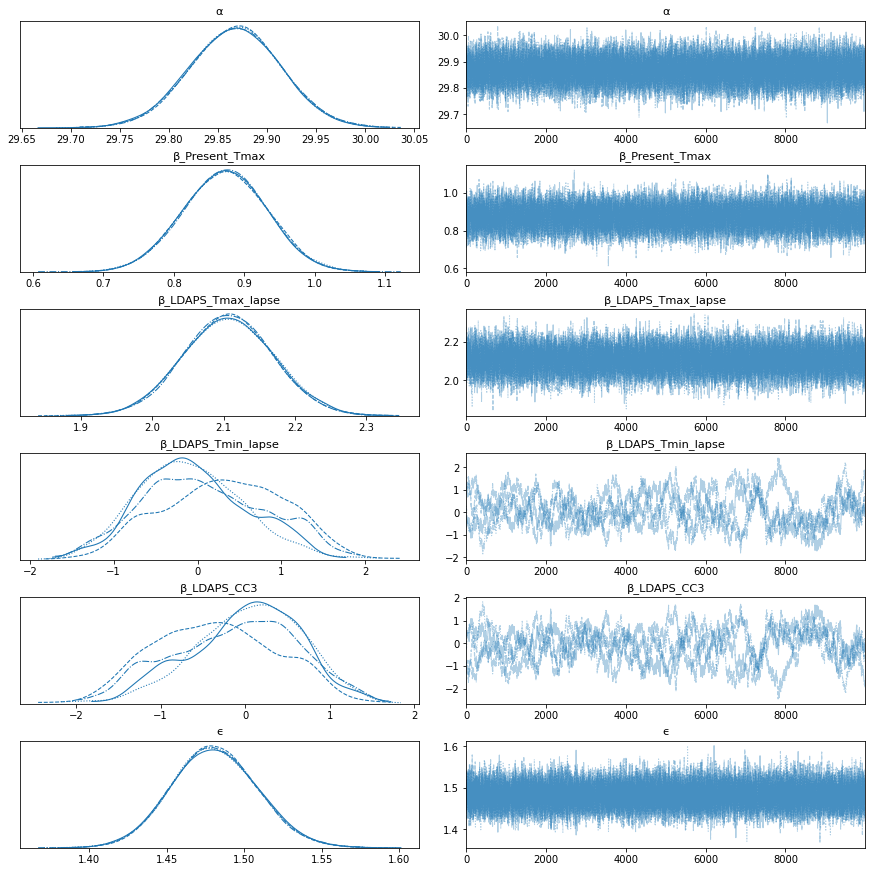

In [49]:
with pm.Model() as model_mlr:

    # Priors
    α = pm.Normal('α', mu=0, sd=1) # Try changing the prior distribution
    
    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
   
    ϵ = pm.HalfCauchy('ϵ', 5)
 
    μ = α + X_Present_Tmax_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_v*β_LDAPS_CC3
    
    # likelihood

    y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv)
    
    step = pm.Slice()

    trace = pm.sample(10000,step, tune=1000)



## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse + beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse + beta_LDAPS_CC3*X_LDAPS_CC3


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y, y_p)
print('Mean square error : ',mse)
r2= r2_score(y, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Slice-Full datastet (general priors','sampling/VI_method':'Slice',
                                     'RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)


In [50]:
model_mlr

In [51]:
X.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,1517.00,1517.00,1517.00,1517.00
mean,-0.01,0.10,0.40,-0.08
std,0.87,0.80,0.71,1.07
min,-2.48,-2.13,-1.69,-1.27
25%,-0.66,-0.51,-0.09,-0.96
50%,0.08,0.13,0.39,-0.44
75%,0.69,0.71,0.86,0.79
max,1.94,2.02,2.00,2.67


#### 2)	Specific informative prior: based on our dataset

In [52]:
X.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,1517.00,1517.00,1517.00,1517.00
mean,-0.01,0.10,0.40,-0.08
std,0.87,0.80,0.71,1.07
min,-2.48,-2.13,-1.69,-1.27
25%,-0.66,-0.51,-0.09,-0.96
50%,0.08,0.13,0.39,-0.44
75%,0.69,0.71,0.86,0.79
max,1.94,2.02,2.00,2.67


In [53]:
df_t.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,7588.00,7588.00,7588.00,7588.00
mean,0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00
min,-3.29,-4.08,-3.94,-1.27
25%,-0.66,-0.66,-0.61,-0.87
50%,0.05,0.03,0.11,-0.22
75%,0.76,0.71,0.70,0.72
max,2.65,3.03,2.61,2.67


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ϵ]
>Slice: [β_LDAPS_CC3]
>Slice: [β_LDAPS_Tmin_lapse]
>Slice: [β_LDAPS_Tmax_lapse]
>Slice: [β_Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 53 seconds.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


4
1517
Root mean square error :  1.4773237695113266
Mean square error :  2.1824855199631554
R2-score :  0.6943591029501757
Adjusted R2-score :  0.6935505291484566


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.91,0.05,29.83,30.00,0.00,0.00,18872.00,18872.00,18869.00,25121.00,1.00
β_Present_Tmax,0.89,0.06,0.78,1.00,0.00,0.00,16226.00,16226.00,16226.00,23099.00,1.00
β_LDAPS_Tmax_lapse,2.12,0.06,2.00,2.24,0.00,0.00,17518.00,17511.00,17516.00,23213.00,1.00
β_LDAPS_Tmin_lapse,0.10,0.49,-0.85,0.99,0.04,0.03,148.00,148.00,138.00,376.00,1.05
β_LDAPS_CC3,-0.16,0.48,-1.05,0.78,0.04,0.03,152.00,152.00,139.00,365.00,1.05
ϵ,1.48,0.03,1.43,1.53,0.00,0.00,39119.00,39074.00,39186.00,29779.00,1.00


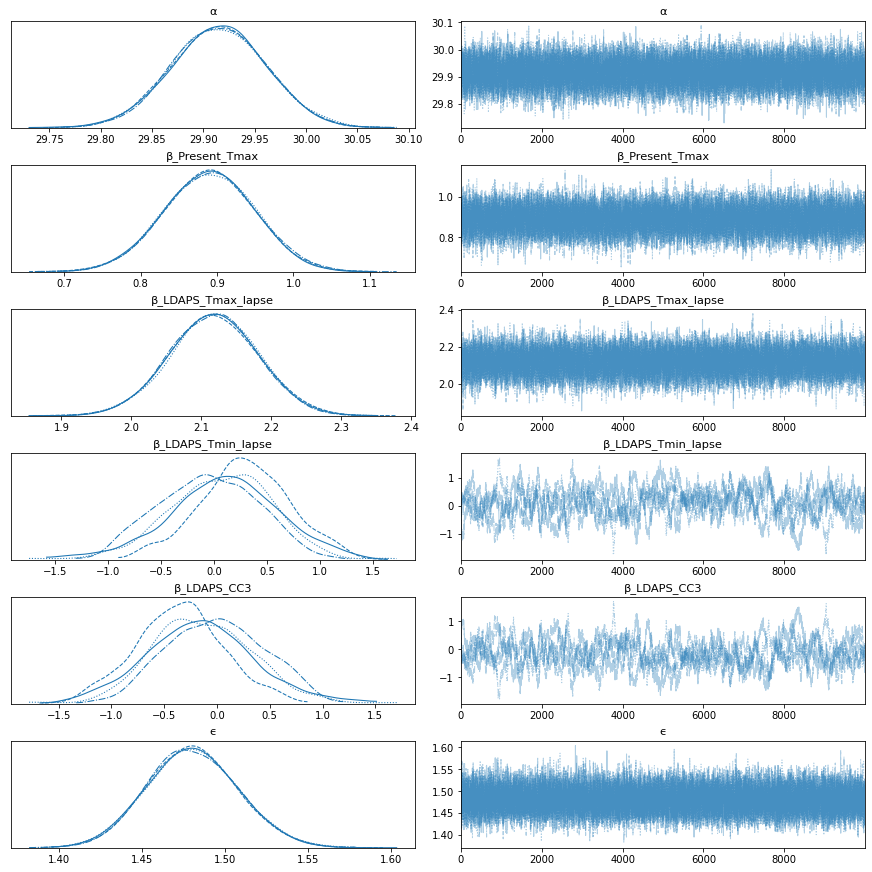

In [54]:
with pm.Model() as model_mlr:

    # Prirors
    α = pm.Normal('α', mu=2, sd=2) # Try changing the prior distribution

    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=30, sd=3)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=30, sd=3)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=25, sd=3)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0.5, sd=0.5)
   
    ϵ = pm.HalfCauchy('ϵ', 5)
 
    μ = α + X_Present_Tmax_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_v*β_LDAPS_CC3
    
    # likelihood

    y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv)
    
    step = pm.Slice()

    trace = pm.sample(10000,step, tune=1000)


## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse + beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse + beta_LDAPS_CC3*X_LDAPS_CC3


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y, y_p)
print('Mean square error : ',mse)
r2= r2_score(y, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)



df_results_r1= df_results_r1.append({'model_name':'MLR-Slice-Full datastet (Specific priors0','sampling/VI_method':'Slice','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)


In [55]:
model_mlr

## MLR on train-test dataset

#### 1)	Generic weakly informative prior: normal(0, 1)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ϵ]
>Slice: [β_LDAPS_CC3]
>Slice: [β_LDAPS_Tmin_lapse]
>Slice: [β_LDAPS_Tmax_lapse]
>Slice: [β_Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 42 seconds.
The estimated number of effective samples is smaller than 200 for some parameters.


4
1517
Root mean square error :  1.3646951866406083
Mean square error :  1.8623929524400444
R2-score :  0.6020483673480297
Adjusted R2-score :  0.6009955852510669


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.61,0.07,29.49,29.73,0.00,0.00,13613.00,13613.00,13614.00,21647.00,1.00
β_Present_Tmax,0.78,0.07,0.65,0.92,0.00,0.00,14459.00,14459.00,14460.00,21499.00,1.00
β_LDAPS_Tmax_lapse,2.01,0.07,1.87,2.15,0.00,0.00,19689.00,19672.00,19690.00,25216.00,1.00
β_LDAPS_Tmin_lapse,-0.01,0.73,-1.29,1.50,0.06,0.04,153.00,153.00,153.00,321.00,1.02
β_LDAPS_CC3,0.17,0.73,-1.26,1.53,0.06,0.04,153.00,153.00,153.00,326.00,1.02
ϵ,1.56,0.04,1.50,1.63,0.00,0.00,38029.00,38002.00,38045.00,28499.00,1.00


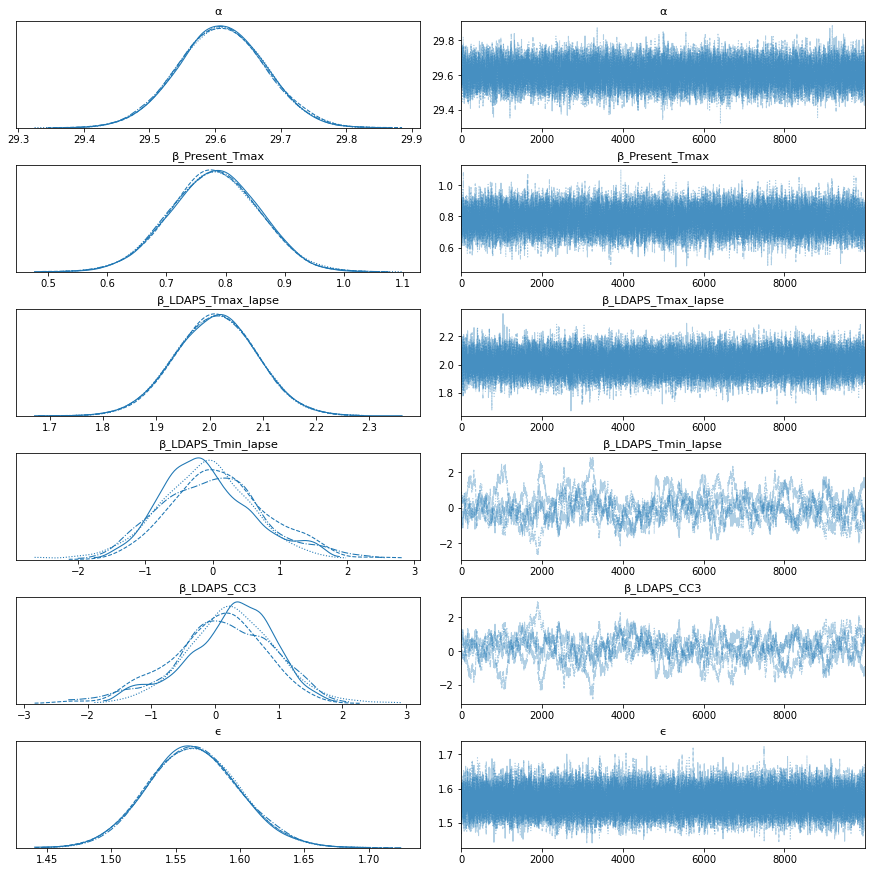

In [56]:
with pm.Model() as model_mlr:

    # Priors
    α = pm.Normal('α', mu=0, sd=1) # Try changing the prior distribution
    
    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
   
    ϵ = pm.HalfCauchy('ϵ', 5)
 
    μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
    
    # likelihood

    y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv_train)
    
    step = pm.Slice()

    trace = pm.sample(10000,step, tune=1000)



## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y_test, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y_test, y_p)
print('Mean square error : ',mse)
r2= r2_score(y_test, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Slice-train/test datastet (general priors','sampling/VI_method':'Slice','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)

In [57]:
model_mlr

#### 2)	Specific informative prior: based on our dataset

In [58]:
X.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,1517.00,1517.00,1517.00,1517.00
mean,-0.01,0.10,0.40,-0.08
std,0.87,0.80,0.71,1.07
min,-2.48,-2.13,-1.69,-1.27
25%,-0.66,-0.51,-0.09,-0.96
50%,0.08,0.13,0.39,-0.44
75%,0.69,0.71,0.86,0.79
max,1.94,2.02,2.00,2.67


In [59]:
df_scaled.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00,7588.00
mean,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.66,-3.29,-4.96,-2.53,-4.09,-4.08,-3.94,-1.93,-2.26,-1.41,-1.38,-1.27,-1.18,-0.31,-0.28,-0.24,-0.22,-1.76,-2.09,-0.91,-0.85,-2.36,-4.13,-4.68
25%,-0.83,-0.66,-0.66,-0.74,-0.58,-0.66,-0.61,-0.65,-0.75,-0.85,-0.83,-0.87,-0.86,-0.31,-0.28,-0.24,-0.22,-0.69,-0.69,-0.61,-0.72,-0.80,-0.66,-0.65
50%,-0.00,0.05,0.09,-0.12,0.20,0.03,0.11,-0.25,-0.17,-0.20,-0.17,-0.22,-0.28,-0.31,-0.28,-0.24,-0.22,0.12,0.05,-0.30,-0.47,0.23,0.05,0.08
75%,0.83,0.76,0.67,0.71,0.75,0.71,0.70,0.43,0.65,0.78,0.78,0.72,0.79,-0.28,-0.27,-0.23,-0.22,0.65,0.64,-0.04,0.37,0.90,0.76,0.68
max,1.66,2.65,2.79,2.86,1.62,3.03,2.61,6.78,4.48,2.28,2.38,2.67,2.67,11.99,12.13,13.58,13.89,1.99,1.81,2.77,2.85,1.51,2.78,2.78


In [60]:
df_t.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,7588.00,7588.00,7588.00,7588.00
mean,0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00
min,-3.29,-4.08,-3.94,-1.27
25%,-0.66,-0.66,-0.61,-0.87
50%,0.05,0.03,0.11,-0.22
75%,0.76,0.71,0.70,0.72
max,2.65,3.03,2.61,2.67


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ϵ]
>Slice: [β_LDAPS_CC3]
>Slice: [β_LDAPS_Tmin_lapse]
>Slice: [β_LDAPS_Tmax_lapse]
>Slice: [β_Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 57 seconds.
The number of effective samples is smaller than 10% for some parameters.


4
1517
Root mean square error :  1.3268905378914295
Mean square error :  1.760638499545807
R2-score :  0.6237910133378659
Adjusted R2-score :  0.6227957514683894


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.70,0.07,29.57,29.82,0.00,0.00,12877.00,12877.00,12879.00,20314.00,1.00
β_Present_Tmax,0.82,0.07,0.69,0.96,0.00,0.00,14615.00,14615.00,14609.00,21666.00,1.00
β_LDAPS_Tmax_lapse,2.03,0.07,1.89,2.17,0.00,0.00,20523.00,20523.00,20520.00,25931.00,1.00
β_LDAPS_Tmin_lapse,0.12,0.31,-0.45,0.72,0.01,0.01,859.00,859.00,859.00,1819.00,1.00
β_LDAPS_CC3,-0.02,0.30,-0.57,0.54,0.01,0.01,865.00,865.00,864.00,1923.00,1.00
ϵ,1.56,0.03,1.50,1.63,0.00,0.00,38911.00,38758.00,39083.00,29656.00,1.00


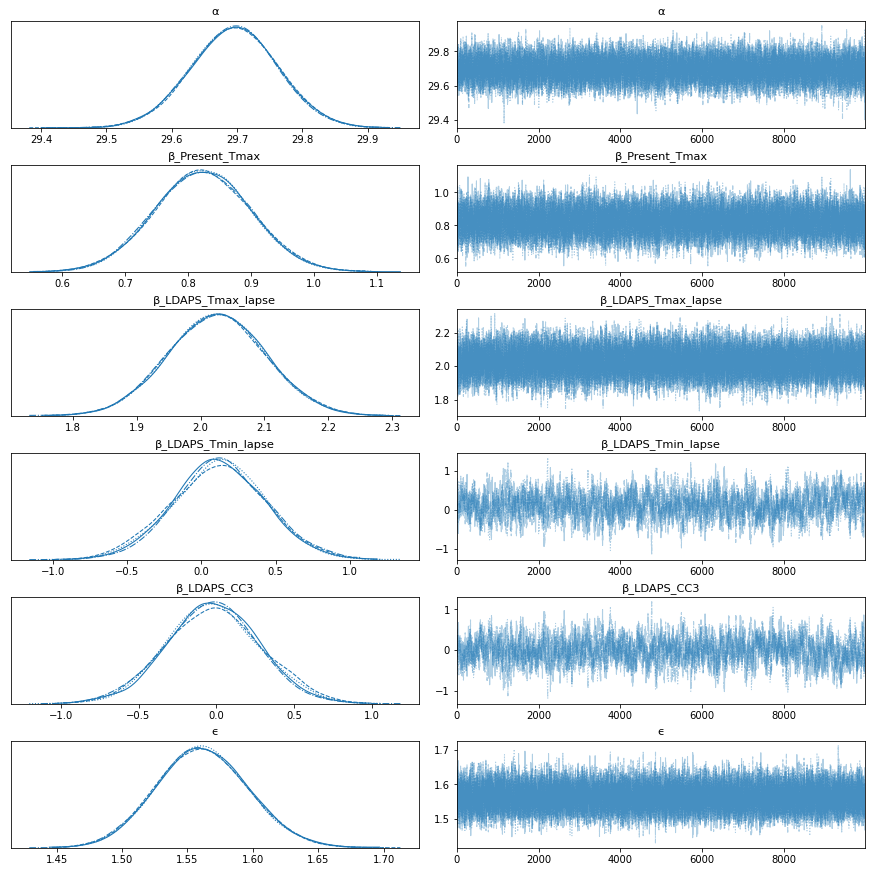

In [61]:
with pm.Model() as model_mlr:

   # Prirors
    α = pm.Normal('α', mu=2, sd=2) # Try changing the prior distribution

    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=10, sd=3)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=10, sd=3)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=15, sd=2)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0.3, sd=0.3)
   
    ϵ = pm.HalfCauchy('ϵ', 5)
 
    μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
    
    # likelihood

    y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv_train)
    
    step = pm.Slice()

    trace = pm.sample(10000,step, tune=1000)




## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y_test, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y_test, y_p)
print('Mean square error : ',mse)
r2= r2_score(y_test, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Slice-train/test datastet (specific priors','sampling/VI_method':'Slice','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)

In [62]:
model_mlr

In [63]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>


In [64]:
X.describe()

,Present_Tmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_CC3
count,1517.00,1517.00,1517.00,1517.00
mean,-0.01,0.10,0.40,-0.08
std,0.87,0.80,0.71,1.07
min,-2.48,-2.13,-1.69,-1.27
25%,-0.66,-0.51,-0.09,-0.96
50%,0.08,0.13,0.39,-0.44
75%,0.69,0.71,0.86,0.79
max,1.94,2.02,2.00,2.67


## Robust MLR NUTS on full dataset

#### 1)	Generic weakly informative prior: normal(0, 1)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ν_]
>Slice: [ϵ]
>Slice: [β_LDAPS_CC3]
>Slice: [β_LDAPS_Tmin_lapse]
>Slice: [β_LDAPS_Tmax_lapse]
>Slice: [β_Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 63 seconds.
The estimated number of effective samples is smaller than 200 for some parameters.


4
1517
Root mean square error :  1.4772697778617603
Mean square error :  2.1823259965837347
R2-score :  0.6943814430153631
Adjusted R2-score :  0.6935729283143455


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.94,0.05,29.85,30.03,0.00,0.00,18255.00,18255.00,18259.00,24327.00,1.00
β_Present_Tmax,0.89,0.06,0.78,1.00,0.00,0.00,16110.00,16105.00,16109.00,22751.00,1.00
β_LDAPS_Tmax_lapse,2.12,0.06,2.01,2.23,0.00,0.00,17089.00,17086.00,17091.00,23816.00,1.00
β_LDAPS_Tmin_lapse,-0.03,0.76,-1.50,1.21,0.08,0.06,93.00,93.00,94.00,192.00,1.04
β_LDAPS_CC3,-0.05,0.76,-1.30,1.41,0.08,0.06,93.00,93.00,95.00,194.00,1.04
ϵ,1.45,0.03,1.40,1.51,0.00,0.00,25530.00,25530.00,25648.00,25084.00,1.00
ν_,63.25,34.62,14.85,126.02,0.22,0.15,25553.00,25553.00,24757.00,24855.00,1.00
ν,64.25,34.62,15.85,127.02,0.22,0.15,25553.00,25553.00,24757.00,24855.00,1.00


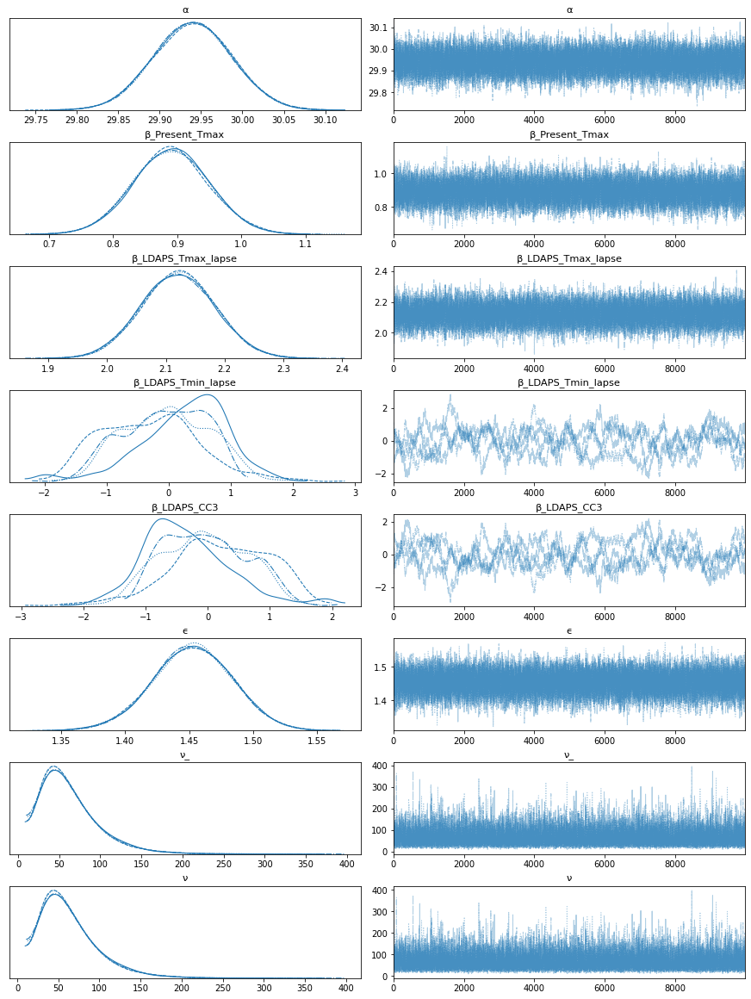

In [65]:
with pm.Model() as model_mlr:

    # Priors
    
    α = pm.Normal('α', mu=y.mean(), sd=1)
    
    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
    
    μ = α + X_Present_Tmax_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_v*β_LDAPS_CC3
   
    ϵ = pm.HalfNormal('ϵ', 5)
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1) # shifting the exponential to avoid values close to 0
    
    # likelihood

    y_pred = pm.StudentT('y_pred', mu=μ, sd=ϵ, nu=ν, observed=yv)
    
    step = pm.Slice()

    trace = pm.sample(10000,step, tune=1000)

#     trace = pm.sample(10000, tune=1000)
    
    


## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse + beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse + beta_LDAPS_CC3*X_LDAPS_CC3


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y, y_p)
print('Mean square error : ',mse)
r2= r2_score(y, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Robust-Slice-Full datastet (general priors','sampling/VI_method':'Slice','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)

In [66]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>


In [67]:
model_mlr

#### 2)	Specific informative prior: based on our dataset

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ν_, ϵ, β_LDAPS_CC3, β_LDAPS_Tmin_lapse, β_LDAPS_Tmax_lapse, β_Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 30 seconds.
The acceptance probability does not match the target. It is 0.8802933440766885, but should be close to 0.8. Try to increase the number of tuning steps.


4
1517
Root mean square error :  1.4773526604559333
Mean square error :  2.1825708833562243
R2-score :  0.6943471484406066
Adjusted R2-score :  0.6935385430132008


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.93,0.04,29.84,30.01,0.00,0.00,48234.00,48233.00,48230.00,31507.00,1.00
β_Present_Tmax,0.89,0.06,0.78,1.00,0.00,0.00,43037.00,42880.00,43047.00,31682.00,1.00
β_LDAPS_Tmax_lapse,2.12,0.06,2.00,2.23,0.00,0.00,42515.00,42515.00,42509.00,31464.00,1.00
β_LDAPS_Tmin_lapse,0.03,0.08,-0.12,0.17,0.00,0.00,34905.00,21018.00,34953.00,28627.00,1.00
β_LDAPS_CC3,-0.08,0.08,-0.22,0.07,0.00,0.00,35567.00,26908.00,35648.00,29696.00,1.00
ϵ,1.45,0.03,1.40,1.51,0.00,0.00,46104.00,46104.00,46336.00,29626.00,1.00
ν_,64.13,34.60,15.58,126.78,0.17,0.13,40660.00,35444.00,41186.00,30993.00,1.00
ν,65.13,34.60,16.58,127.78,0.17,0.13,40660.00,35501.00,41186.00,30993.00,1.00


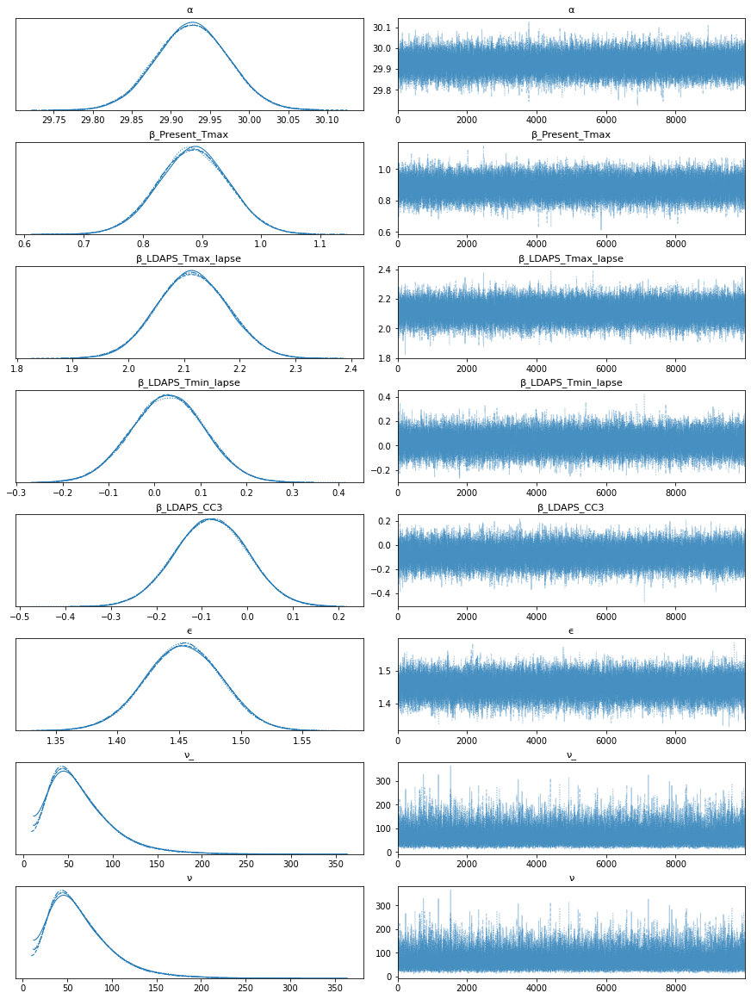

In [68]:
with pm.Model() as model_mlr:

    # Prirors
    α = pm.Normal('α', mu=y.mean(), sd=1) # Try changing the prior distribution

    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=8, sd=2)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=2, sd=1)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0.12, sd=0.1)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0.01, sd=0.1)
   
    μ = α + X_Present_Tmax_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_v*β_LDAPS_CC3
   
    ϵ = pm.HalfNormal('ϵ', 5)
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1) # shifting the exponential to avoid values close to 0
    
    # likelihood

    y_pred = pm.StudentT('y_pred', mu=μ, sd=ϵ, nu=ν, observed=yv)

    trace = pm.sample(10000, tune=1000)
    


## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse + beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse + beta_LDAPS_CC3*X_LDAPS_CC3


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y, y_p)
print('Mean square error : ',mse)
r2= r2_score(y, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Robust-Nuts-Full datastet (Specific priors)','sampling/VI_method':'NUTS','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)



In [69]:
model_mlr

## MLR-Robust NUTS on train-test dataset

#### 1)	Generic weakly informative prior: normal(0, 1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ν_, ϵ, β_LDAPS_CC3, β_LDAPS_Tmin_lapse, β_LDAPS_Tmax_lapse, β_Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 106 seconds.
The acceptance probability does not match the target. It is 0.8820368605664318, but should be close to 0.8. Try to increase the number of tuning steps.


4
1517
Root mean square error :  1.3102595211116799
Mean square error :  1.7167800126638086
R2-score :  0.6331625889967349
Adjusted R2-score :  0.6321921196554565


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.74,0.07,29.62,29.87,0.00,0.00,28136.00,28136.00,28127.00,27637.00,1.00
β_Present_Tmax,0.84,0.07,0.71,0.98,0.00,0.00,26902.00,26832.00,26897.00,28580.00,1.00
β_LDAPS_Tmax_lapse,2.04,0.07,1.90,2.18,0.00,0.00,29191.00,29178.00,29195.00,26875.00,1.00
β_LDAPS_Tmin_lapse,0.02,0.71,-1.31,1.35,0.01,0.00,20439.00,19465.00,20450.00,23822.00,1.00
β_LDAPS_CC3,0.02,0.71,-1.30,1.34,0.01,0.00,20483.00,19349.00,20494.00,23995.00,1.00
ϵ,1.54,0.04,1.47,1.61,0.00,0.00,31214.00,31214.00,31145.00,25558.00,1.00
ν_,71.50,36.84,18.14,140.03,0.21,0.15,30400.00,28257.00,30703.00,27921.00,1.00
ν,72.50,36.84,19.14,141.03,0.21,0.15,30400.00,28288.00,30703.00,27921.00,1.00


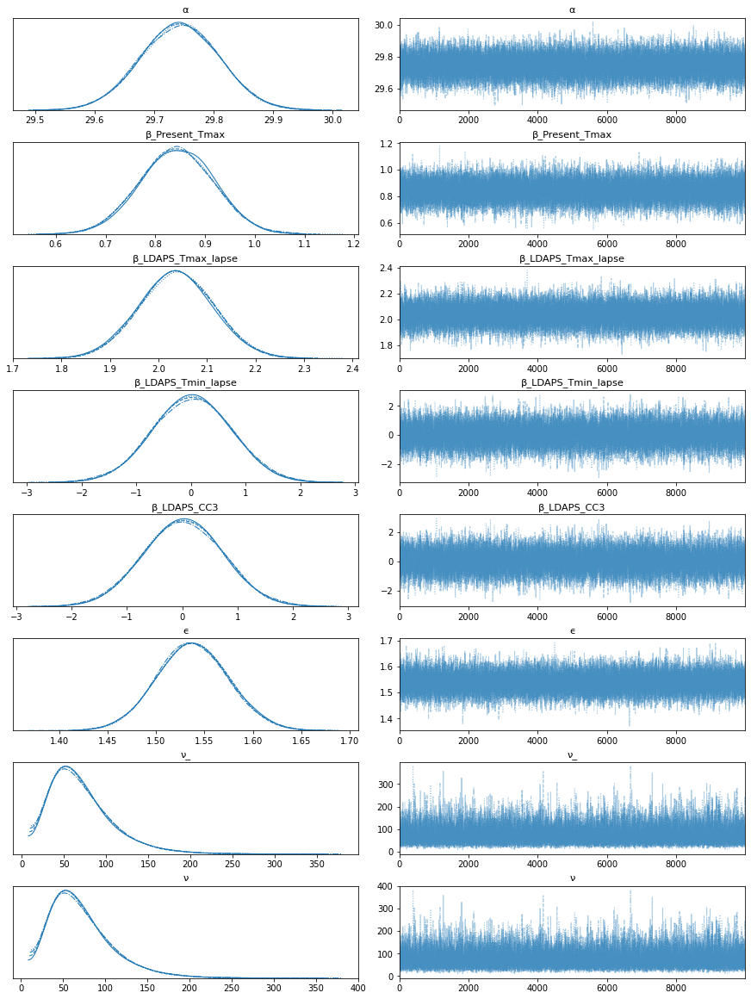

In [70]:
with pm.Model() as model_mlr:

    # Priors
    
    α = pm.Normal('α', mu=y.mean(), sd=1)
    
    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
    
    μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
   
    ϵ = pm.HalfNormal('ϵ', 5)
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1) # shifting the exponential to avoid values close to 0
    
    # likelihood

    y_pred = pm.StudentT('y_pred', mu=μ, sd=ϵ, nu=ν, observed=yv_train)

    trace = pm.sample(10000, tune=1000)
    
    
    



## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y_test, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y_test, y_p)
print('Mean square error : ',mse)
r2= r2_score(y_test, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Robust-Nuts-train/test datastet (general priors',
                                     'sampling/VI_method':'NUTS','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)

In [71]:
model_mlr

#### 2)	Specific informative prior: based on our dataset

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ν_, ϵ, β_LDAPS_CC3, β_LDAPS_Tmin_lapse, β_LDAPS_Tmax_lapse, β_Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 27 seconds.


4
1517
Root mean square error :  1.3109193892459325
Mean square error :  1.7185096451009285
R2-score :  0.6327930053106832
Adjusted R2-score :  0.6318215582347855


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
α,29.74,0.06,29.62,29.86,0.00,0.00,45110.00,45110.00,45120.00,31331.00,1.00
β_Present_Tmax,0.84,0.07,0.71,0.98,0.00,0.00,42245.00,42077.00,42248.00,30671.00,1.00
β_LDAPS_Tmax_lapse,2.04,0.07,1.90,2.18,0.00,0.00,43786.00,43786.00,43777.00,29594.00,1.00
β_LDAPS_Tmin_lapse,0.09,0.08,-0.07,0.24,0.00,0.00,43881.00,32009.00,43912.00,30263.00,1.00
β_LDAPS_CC3,-0.03,0.08,-0.17,0.13,0.00,0.00,43580.00,21752.00,43613.00,29920.00,1.00
ϵ,1.54,0.04,1.47,1.61,0.00,0.00,45010.00,45010.00,44988.00,29142.00,1.00
ν_,71.75,36.88,18.14,139.43,0.18,0.14,42090.00,36948.00,43297.00,31380.00,1.00
ν,72.75,36.88,19.14,140.43,0.18,0.14,42090.00,37002.00,43297.00,31380.00,1.00


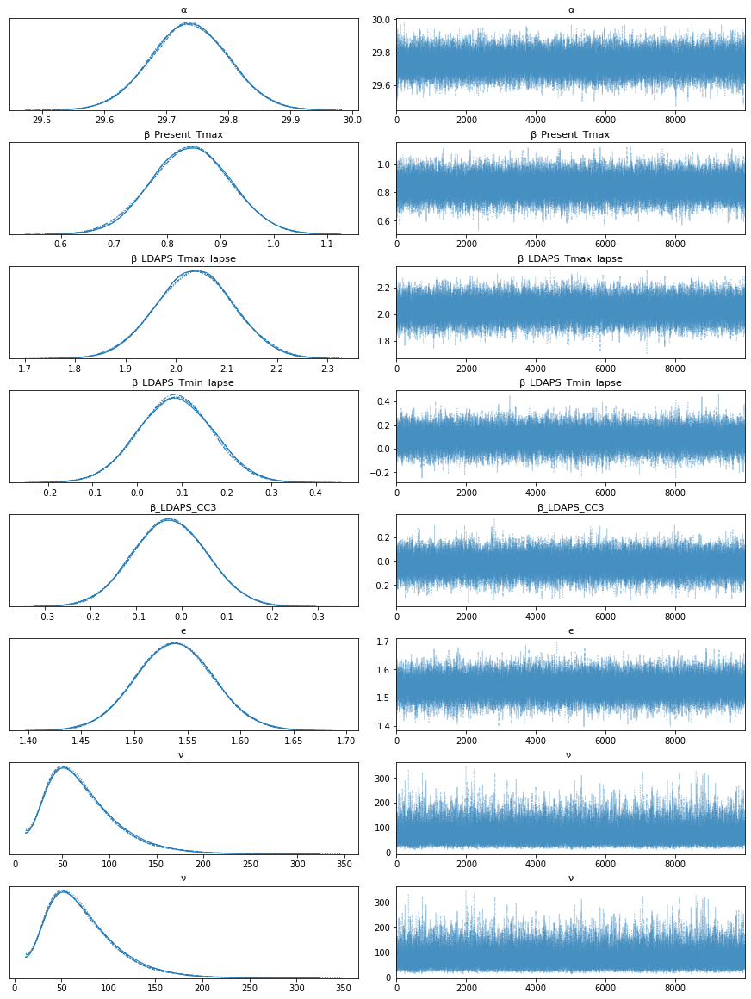

In [72]:
with pm.Model() as model_mlr:
    

    
    # Prirors
    α = pm.Normal('α', mu=y.mean(), sd=1) # Try changing the prior distribution

    β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=8, sd=2)
    β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=2, sd=1)
    β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0.12, sd=0.1)
    β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0.01, sd=0.1)
   
    μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
   
    ϵ = pm.HalfNormal('ϵ', 5)
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1) # shifting the exponential to avoid values close to 0
    
    # likelihood

    y_pred = pm.StudentT('y_pred', mu=μ, sd=ϵ, nu=ν, observed=yv_train)

    trace = pm.sample(10000, tune=1000)
    


## Finding the paramters from the  drawn samples

alpha=trace['α'].mean()
beta_Present_Tmax=trace['β_Present_Tmax'].mean()
beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



# Predicted y oytput
y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


## Evaluating reults
p= len(X.columns)
print(p)
n= len(X.index)
print(n)

rmse = mean_squared_error(y_test, y_p, squared=False)
print('Root mean square error : ',rmse)
mse = mean_squared_error(y_test, y_p)
print('Mean square error : ',mse)
r2= r2_score(y_test, y_p)
print('R2-score : ',r2)
Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
print('Adjusted R2-score : ',Adj_r2)


df_results_r1= df_results_r1.append({'model_name':'MLR-Robust-Nuts-train/test datastet (specific priors',
                                     'sampling/VI_method':'NUTS','RMSE':rmse,'MSE':mse,'R2':r2,
                                  'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

az.summary(trace)

pm.traceplot(trace)
pm.summary(trace)

In [73]:
model_mlr

In [74]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general p...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific ...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


### Chosing the best model hence from above results best results are given by generic prirors with robust MLR on train/test datset we will use this model and prior for our further analysis

## Making a MCMC function for our best models

In [75]:
def model_mcmc(sampling):
    
#     step=sampling

    with pm.Model() as model_mlr:
        
         # Priors
         
         
            # Priors
        α = pm.Normal('α', mu=0, sd=1) # Try changing the prior distribution
        
        β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
        β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
        β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
        β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
    
        ϵ = pm.HalfCauchy('ϵ', 5)
    
        μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
        
        # likelihood

        y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv_train)
        
    
        # α = pm.Normal('α', mu=y.mean(), sd=1)
        
        # β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
        # β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
        # β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
        # β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
        
        # μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
        
        # ϵ = pm.HalfNormal('ϵ', 5)
        # ν_ = pm.Exponential('ν_', 1/29)
        # ν = pm.Deterministic('ν', ν_ + 1) # shifting the exponential to avoid values close to 0
        
        # # likelihood

        # y_pred = pm.StudentT('y_pred', mu=μ,sd=ϵ, nu=ν, observed=yv_train)
        
        if sampling == 'HMC':
            step = pm.HamiltonianMC()
            
        elif sampling == 'metropolis':
            step = pm.Metropolis()
            
        elif sampling == 'slice':
            step = pm.Slice()
            
        elif sampling == 'NUTS':
            step = pm.NUTS()
        
        
#         step = pm.Slice()
#         step = pm.HamiltonianMC()
        # step = pm.Metropolis()
        trace = pm.sample(2000,step, tune=1000)
     


    ## Finding the paramters from the  drawn samples

    alpha=trace['α'].mean()
    beta_Present_Tmax=trace['β_Present_Tmax'].mean()
    beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
    beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
    beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()



    # Predicted y oytput
    y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


    ## Evaluating reults
    p= len(X.columns)
    print(p)
    n= len(X.index)
    print(n)

    rmse = mean_squared_error(y_test, y_p, squared=False)
    print('Root mean seure error : ',rmse)
    mse = mean_squared_error(y_test, y_p)
    print('Mean seure error : ',mse)
    r2= r2_score(y_test, y_p)
    print('R2-score : ',r2)
    Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
    print('Adjusted R2-score : ',Adj_r2)
    
    global df_results_r1


    df_results_r1= df_results_r1.append({'model_name':str(sampling)+' MLR-train/test datastet (G)',
                                        'sampling/VI_method':sampling,'RMSE':rmse,'MSE':mse,'R2':r2,
                                    'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

    az.summary(trace)

    pm.traceplot(trace)
    print(pm.summary(trace))
    return(model_mlr)

## Making a function for Variational Inference

In [76]:
def model_vi(vi_method):
    
    vi=vi_method

    with pm.Model() as model_mlr:
        
        # Priors
        
            
        α = pm.Normal('α', mu=0, sd=1) # Try changing the prior distribution
        
        β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=0, sd=1)
        β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=0, sd=1)
        β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=0, sd=1)
        β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0., sd=1)
    
        ϵ = pm.HalfCauchy('ϵ', 5)
    
        μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3
        
        # likelihood

        y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv_train)
        
 
    
    
    print('for VI')
    with model_mlr:
        mean_field = pm.fit(method=vi_method) # VI
        

    trace=mean_field.sample(10000)    



    alpha=trace['α'].mean()
    beta_Present_Tmax=trace['β_Present_Tmax'].mean()
    beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
    beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
    beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()


    # Predicted y oytput
    y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


    ## Evaluating reults
    p= len(X.columns)
    print(p)
    n= len(X.index)
    print(n)

    rmse = mean_squared_error(y_test, y_p, squared=False)
    print('Root mean seure error : ',rmse)
    mse = mean_squared_error(y_test, y_p)
    print('Mean seure error : ',mse)
    r2= r2_score(y_test, y_p)
    print('R2-score : ',r2)
    Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
    print('Adjusted R2-score : ',Adj_r2)

    global df_results_r1


    df_results_r1= df_results_r1.append({'model_name':str(vi_method)+' MLR-train/test datastet (G)',
                                        'sampling/VI_method':vi_method,'RMSE':rmse,'MSE':mse,'R2':r2,
                                    'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

    az.summary(trace)

    pm.traceplot(trace)
    pm.summary(trace)
    return(model_mlr)

In [77]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general p...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific ...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


# MCMC differnet Sampling Methods

## 1 NUTS

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ϵ, β_LDAPS_CC3, β_LDAPS_Tmin_lapse, β_LDAPS_Tmax_lapse, β_Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 18 seconds.


4
1517
Root mean seure error :  1.3650833633859976
Mean seure error :  1.8634525889932276
R2-score :  0.6018219467659477
Adjusted R2-score :  0.600768565672736
                    mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                  29.61 0.07   29.49    29.73       0.00     0.00   5577.00   
β_Present_Tmax      0.78 0.07    0.64     0.92       0.00     0.00   4358.00   
β_LDAPS_Tmax_lapse  2.01 0.07    1.87     2.15       0.00     0.00   5113.00   
β_LDAPS_Tmin_lapse  0.07 0.72   -1.28     1.41       0.01     0.01   3822.00   
β_LDAPS_CC3         0.09 0.72   -1.23     1.49       0.01     0.01   3822.00   
ϵ                   1.56 0.03    1.50     1.63       0.00     0.00   5888.00   

                    ess_sd  ess_bulk  ess_tail  r_hat  
α                  5577.00   5586.00   5268.00   1.00  
β_Present_Tmax     4344.00   4347.00   5000.00   1.00  
β_LDAPS_Tmax_lapse 5113.00   5112.00   5112.00   1.00  
β_LDAPS_Tmin_lapse 3193.00   3827.00   4206.00   1.00  

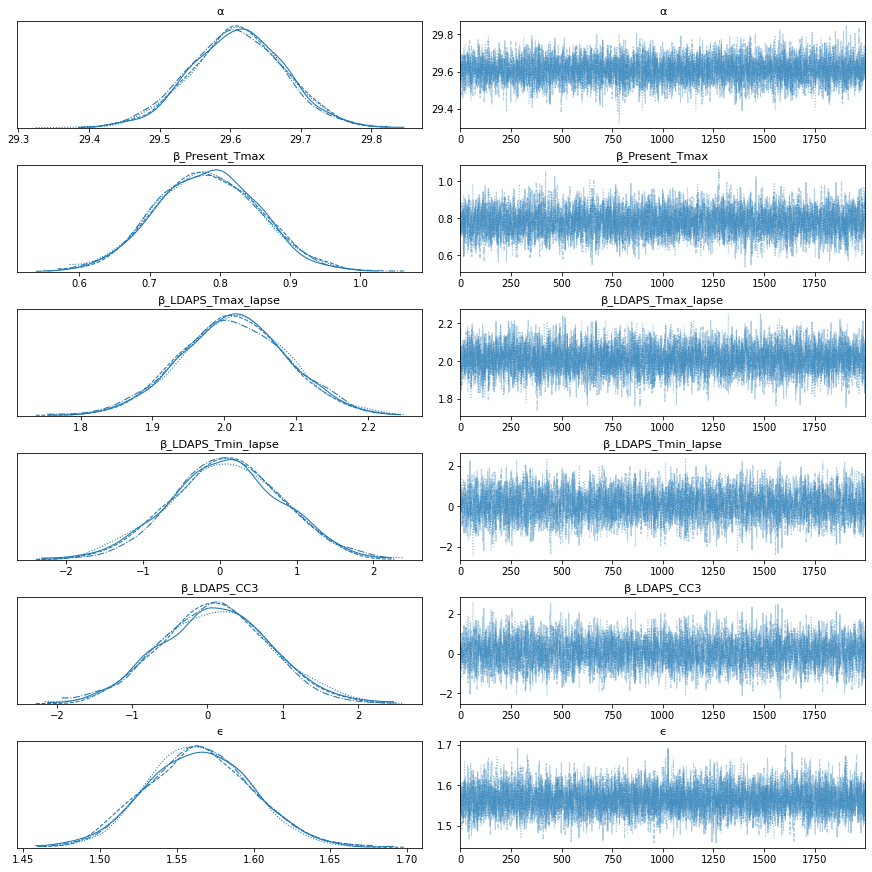

In [78]:
nuts=model_mcmc('NUTS')

In [79]:
model_mlr

In [80]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general p...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific ...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


## HMC

Multiprocess sampling (4 chains in 4 jobs)
HamiltonianMC: [ϵ, β_LDAPS_CC3, β_LDAPS_Tmin_lapse, β_LDAPS_Tmax_lapse, β_Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 19 seconds.
The acceptance probability does not match the target. It is 0.7992027441769497, but should be close to 0.65. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8067624986950281, but should be close to 0.65. Try to increase the number of tuning steps.
There were 7 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.8130603837079604, but should be close to 0.65. Try to increase the number of tuning steps.


4
1517
Root mean seure error :  1.3650842235237046
Mean seure error :  1.8634549373133154
R2-score :  0.6018214449825772
Adjusted R2-score :  0.6007680625618962
                    mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                  29.61 0.07   29.48    29.73       0.00     0.00   6637.00   
β_Present_Tmax      0.78 0.07    0.64     0.92       0.00     0.00   5627.00   
β_LDAPS_Tmax_lapse  2.01 0.08    1.87     2.15       0.00     0.00   6090.00   
β_LDAPS_Tmin_lapse  0.09 0.71   -1.25     1.42       0.01     0.01   3588.00   
β_LDAPS_CC3         0.07 0.71   -1.29     1.36       0.01     0.01   3581.00   
ϵ                   1.56 0.04    1.50     1.63       0.00     0.00   7248.00   

                    ess_sd  ess_bulk  ess_tail  r_hat  
α                  6637.00   6658.00   5125.00   1.00  
β_Present_Tmax     5627.00   5634.00   4596.00   1.00  
β_LDAPS_Tmax_lapse 6090.00   6097.00   5127.00   1.00  
β_LDAPS_Tmin_lapse 3588.00   3592.00   3863.00   1.00 

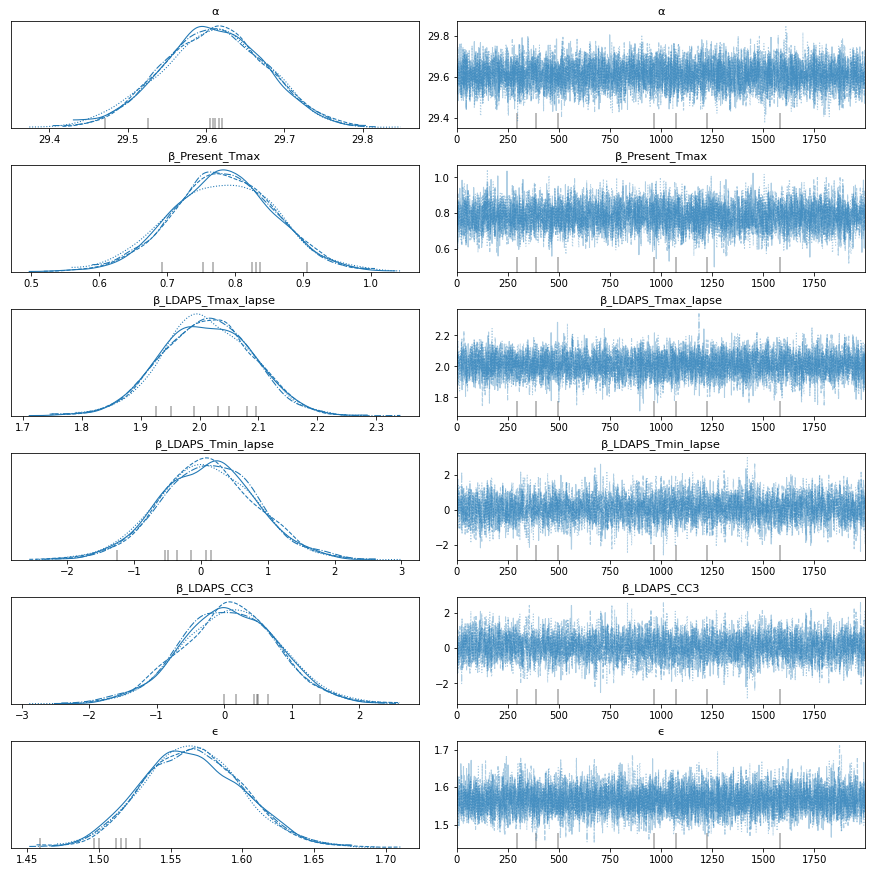

In [81]:
hmc=model_mcmc('HMC')

In [82]:
model_mlr

## Metrolpis

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [ϵ]
>Metropolis: [β_LDAPS_CC3]
>Metropolis: [β_LDAPS_Tmin_lapse]
>Metropolis: [β_LDAPS_Tmax_lapse]
>Metropolis: [β_Present_Tmax]
>Metropolis: [α]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 3 seconds.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


4
1517
Root mean seure error :  1.3620109274651528
Mean seure error :  1.8550737665344856
R2-score :  0.6036123133332121
Adjusted R2-score :  0.6025636686594904
                    mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                  29.62 0.06   29.50    29.73       0.00     0.00    371.00   
β_Present_Tmax      0.79 0.07    0.65     0.93       0.01     0.00    251.00   
β_LDAPS_Tmax_lapse  2.01 0.08    1.87     2.15       0.00     0.00    472.00   
β_LDAPS_Tmin_lapse -0.27 0.96   -1.82     1.37       0.45     0.34      4.00   
β_LDAPS_CC3         0.42 0.95   -1.23     1.95       0.45     0.34      4.00   
ϵ                   1.56 0.03    1.50     1.63       0.00     0.00    920.00   

                    ess_sd  ess_bulk  ess_tail  r_hat  
α                   371.00    374.00    597.00   1.01  
β_Present_Tmax      250.00    253.00    333.00   1.01  
β_LDAPS_Tmax_lapse  472.00    473.00    763.00   1.01  
β_LDAPS_Tmin_lapse    4.00      5.00     20.00   2.27 

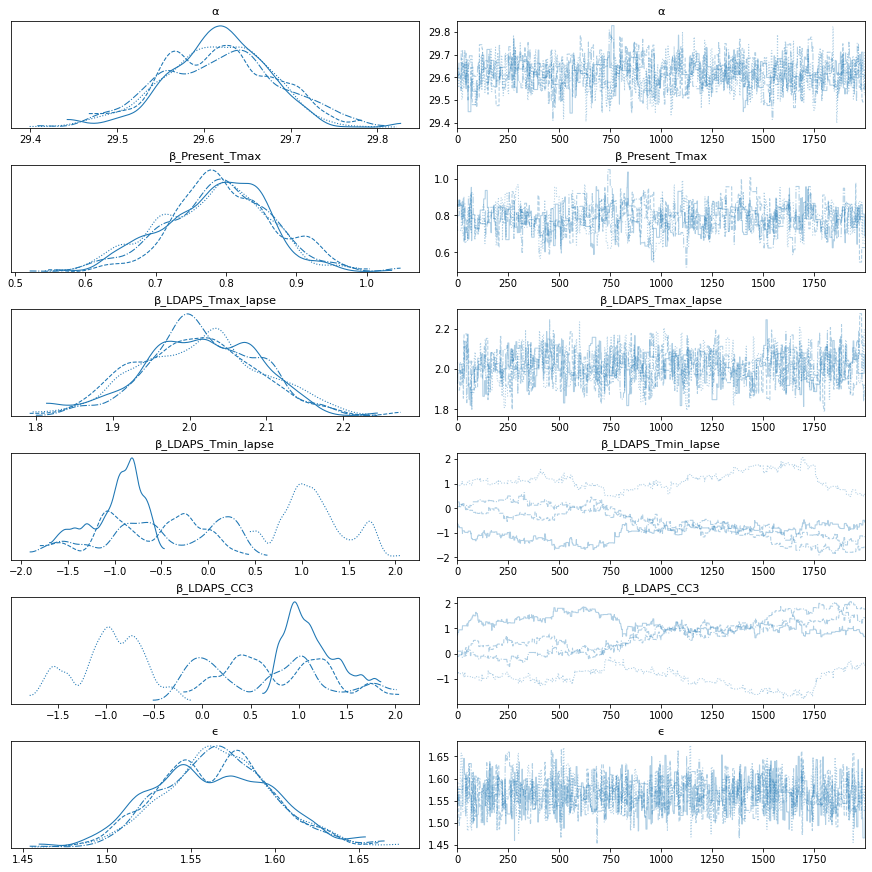

In [83]:
metrolpis=model_mcmc('metropolis')

In [84]:
model_mlr

In [85]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general p...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific ...,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


## Slice

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ϵ]
>Slice: [β_LDAPS_CC3]
>Slice: [β_LDAPS_Tmin_lapse]
>Slice: [β_LDAPS_Tmax_lapse]
>Slice: [β_Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 11 seconds.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


4
1517
Root mean seure error :  1.3646525064230424
Mean seure error :  1.8622764632866917
R2-score :  0.6020732584692629
Adjusted R2-score :  0.6010205422218271
                    mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                  29.61 0.07   29.49    29.73       0.00     0.00   2652.00   
β_Present_Tmax      0.78 0.07    0.63     0.92       0.00     0.00   2810.00   
β_LDAPS_Tmax_lapse  2.01 0.07    1.87     2.15       0.00     0.00   3951.00   
β_LDAPS_Tmin_lapse  0.34 0.75   -0.99     1.74       0.18     0.13     17.00   
β_LDAPS_CC3        -0.18 0.75   -1.55     1.16       0.18     0.13     17.00   
ϵ                   1.56 0.04    1.50     1.63       0.00     0.00   7598.00   

                    ess_sd  ess_bulk  ess_tail  r_hat  
α                  2651.00   2654.00   4276.00   1.00  
β_Present_Tmax     2810.00   2817.00   3838.00   1.00  
β_LDAPS_Tmax_lapse 3951.00   3960.00   4505.00   1.00  
β_LDAPS_Tmin_lapse   17.00     17.00     57.00   1.18 

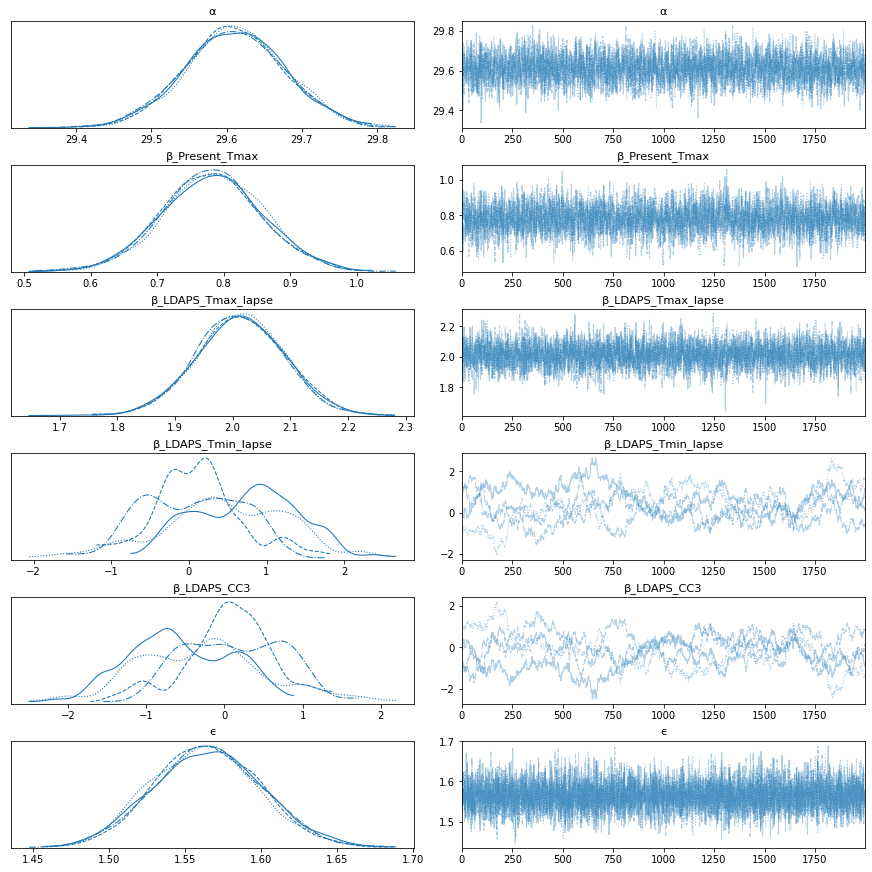

In [86]:
slice= model_mcmc('slice')

# Variational Inference Methods

## ADVI

for VI


Finished [100%]: Average Loss = 4,981.5


4
1517
Root mean seure error :  28.22523359296282
Mean seure error :  796.6638113773168
R2-score :  -169.22920109151923
Adjusted R2-score :  -169.67954289334864


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

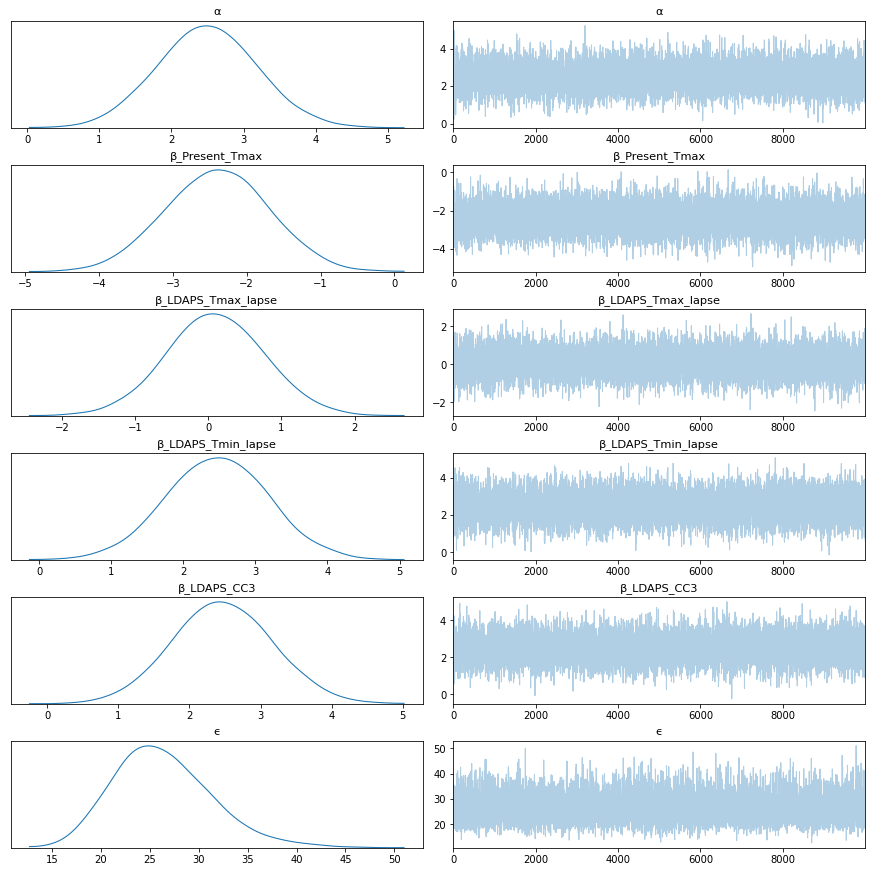

In [87]:
advi=model_vi('advi')


## fullrank advi

for VI


Finished [100%]: Average Loss = 4,933.5


4
1517
Root mean seure error :  28.06343381596008
Mean seure error :  787.5563175427719
R2-score :  -167.28313378275047
Adjusted R2-score :  -167.7283272583662


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

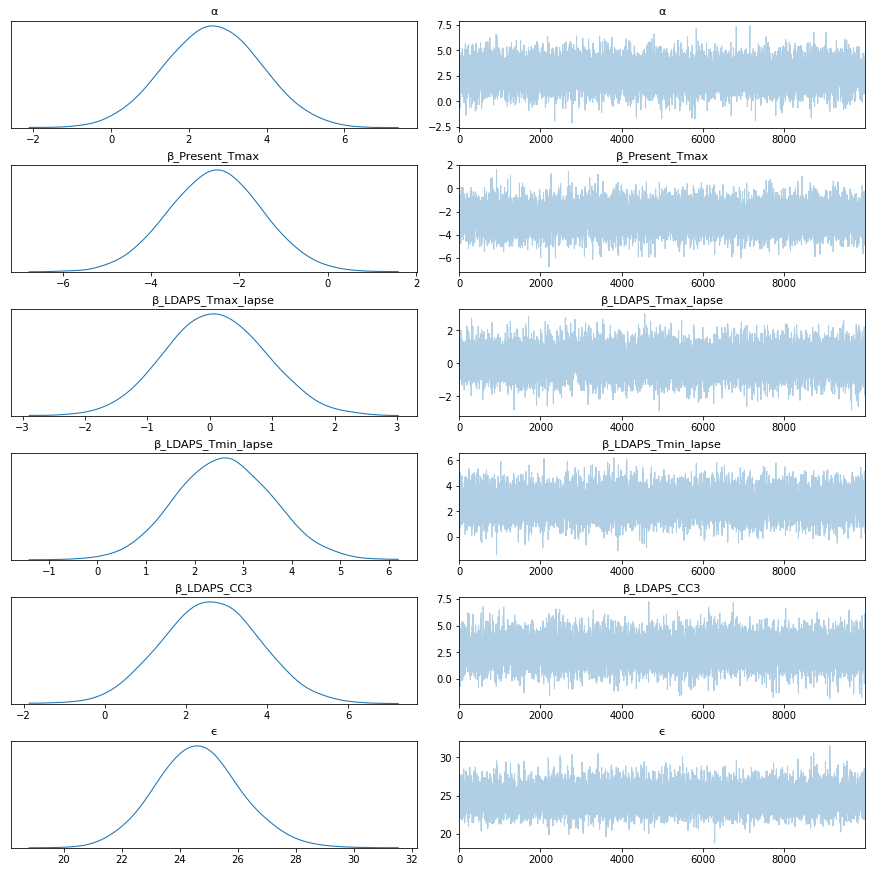

In [88]:
fr_advi=model_vi('fullrank_advi')



## svgd

for VI


4
1517
Root mean seure error :  27.373518354982394
Mean seure error :  749.3095071305581
R2-score :  -159.11064761256304
Adjusted R2-score :  -159.5342207543952


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

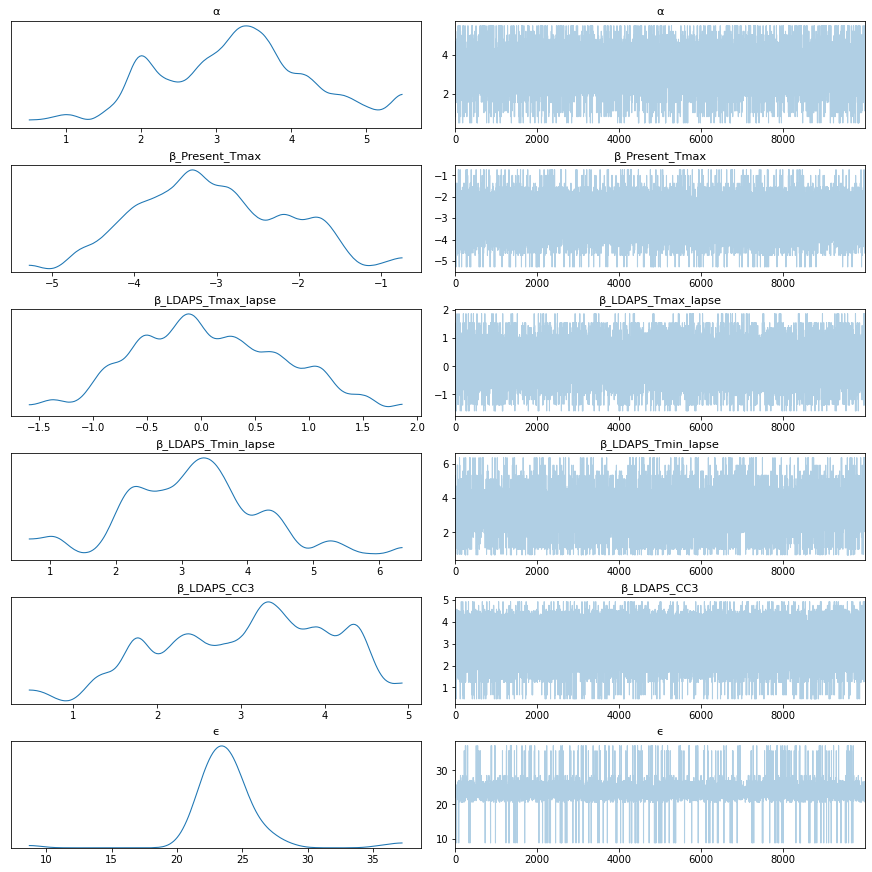

In [89]:
svgd= model_vi('svgd')

In [90]:
pd.set_option('display.max_colwidth', None)
# pd.set_option('display.max_columns', 500)

In [91]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general priors,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific priors,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


In [92]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general priors,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific priors,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


## Making a new function for VI

In [102]:
def model_vi_new(vi_method):
    
    vi=vi_method

    with pm.Model() as model_mlr:
        
        
        
           # Prirors
        α = pm.Normal('α', mu=2, sd=2) # Try changing the prior distribution

        β_Present_Tmax = pm.Normal('β_Present_Tmax', mu=10, sd=3)
        β_LDAPS_Tmax_lapse = pm.Normal('β_LDAPS_Tmax_lapse', mu=10, sd=3)
        β_LDAPS_Tmin_lapse = pm.Normal('β_LDAPS_Tmin_lapse', mu=15, sd=2)
        β_LDAPS_CC3 = pm.Normal('β_LDAPS_CC3', mu=0.3, sd=0.3)

        ϵ = pm.HalfCauchy('ϵ', 5)

        μ = α + X_Present_Tmax_train_v*β_Present_Tmax + X_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + X_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + X_LDAPS_CC3_train_v*β_LDAPS_CC3

        # likelihood

        y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv_train)
        

    print('for VI')
    with model_mlr:
        mean_field = pm.fit(method=vi_method) # VI
        

    trace=mean_field.sample(10000)    



    alpha=trace['α'].mean()
    beta_Present_Tmax=trace['β_Present_Tmax'].mean()
    beta_LDAPS_Tmax_lapse=trace['β_LDAPS_Tmax_lapse'].mean()
    beta_LDAPS_Tmin_lapse=trace['β_LDAPS_Tmin_lapse'].mean()
    beta_LDAPS_CC3=trace['β_LDAPS_CC3'].mean()


    # Predicted y oytput
    y_p = alpha + beta_Present_Tmax*X_Present_Tmax_test + beta_LDAPS_Tmax_lapse*X_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*X_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*X_LDAPS_CC3_test


    ## Evaluating reults
    p= len(X.columns)
    print(p)
    n= len(X.index)
    print(n)

    rmse = mean_squared_error(y_test, y_p, squared=False)
    print('Root mean seure error : ',rmse)
    mse = mean_squared_error(y_test, y_p)
    print('Mean seure error : ',mse)
    r2= r2_score(y_test, y_p)
    print('R2-score : ',r2)
    Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
    print('Adjusted R2-score : ',Adj_r2)

    global df_results_r1


    df_results_r1= df_results_r1.append({'model_name':str(vi_method)+' MLR-new-train/test datastet (G)',
                                        'sampling/VI_method':vi_method,'RMSE':rmse,'MSE':mse,'R2':r2,
                                    'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

    az.summary(trace)

    pm.traceplot(trace)
    pm.summary(trace)
    return(model_mlr)

### VI with new function

for VI


Finished [100%]: Average Loss = 5,066


4
1517
Root mean seure error :  21.836050126683006
Mean seure error :  476.81308513501284
R2-score :  -100.88426961705323
Adjusted R2-score :  -101.15380472186024


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

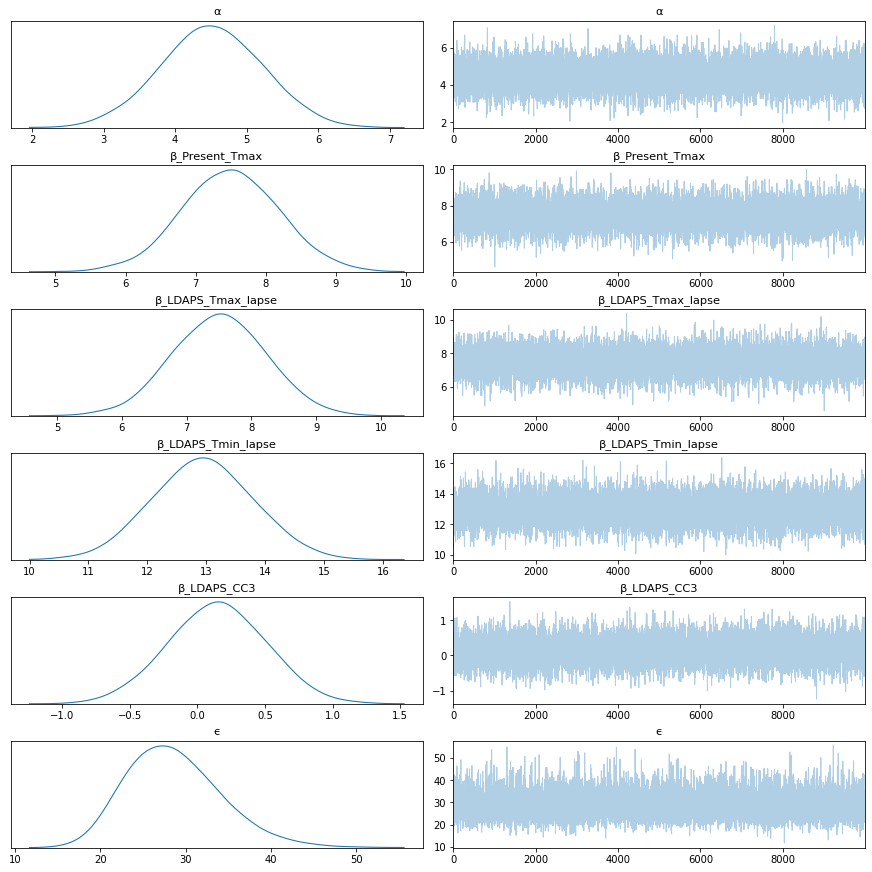

In [103]:
advi=model_vi_new('advi')

for VI


Finished [100%]: Average Loss = 5,019.5


4
1517
Root mean seure error :  21.792513042575425
Mean seure error :  474.9136247108201
R2-score :  -100.47839749647042
Adjusted R2-score :  -100.7468588655087


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

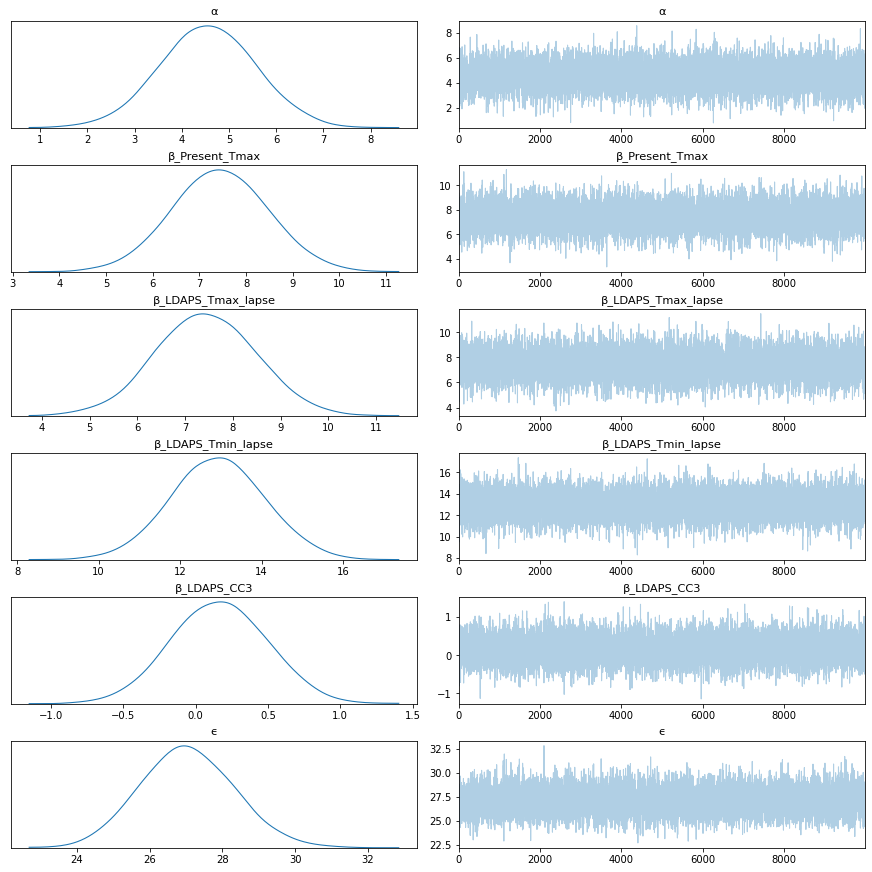

In [104]:
fr_advi=model_vi_new('fullrank_advi')

for VI


4
1517
Root mean seure error :  21.376134543800134
Mean seure error :  456.9391280346453
R2-score :  -96.6376504140625
Adjusted R2-score :  -96.89595107653356


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

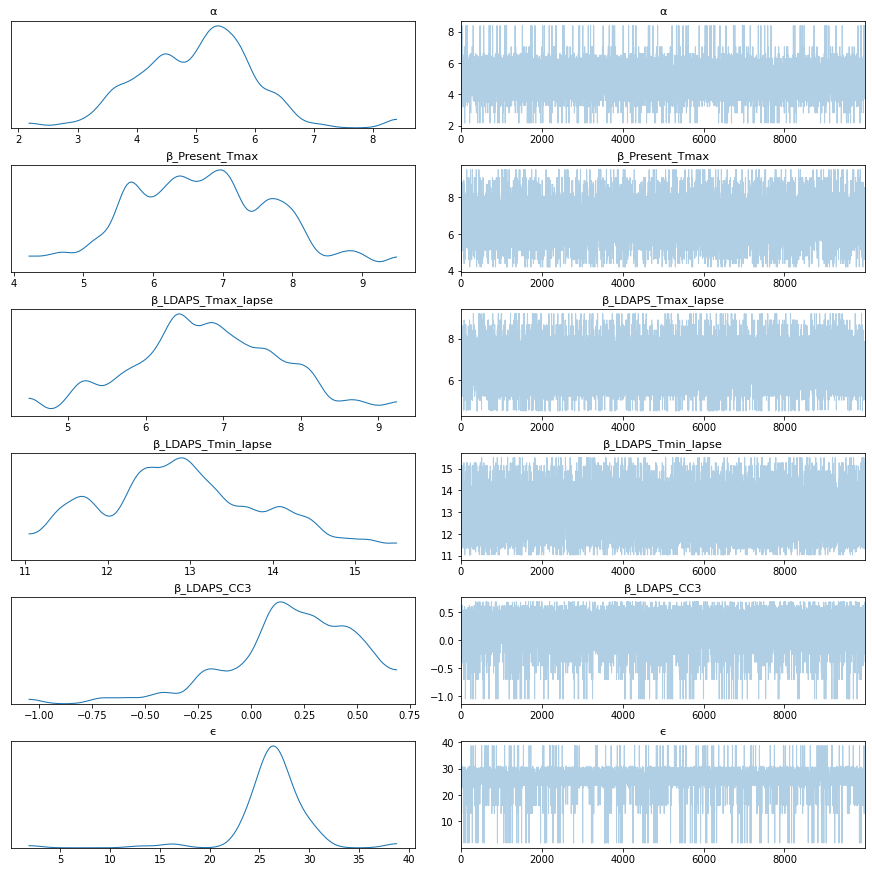

In [105]:
svgd= model_vi_new('svgd')

## Nows using scaled dataset to get better results for VI

In [115]:
X_Present_Tmax_v=X['Present_Tmax'].values
print(X_Present_Tmax_v.shape)

X_LDAPS_Tmax_lapse_v= X['LDAPS_Tmax_lapse'].values

X_LDAPS_Tmin_lapse_v=X['LDAPS_Tmin_lapse'].values

X_LDAPS_CC3_v =X['LDAPS_CC3'].values



X_Present_Tmax=X['Present_Tmax']
print(X_Present_Tmax.shape)

X_LDAPS_Tmax_lapse= X['LDAPS_Tmax_lapse']

X_LDAPS_Tmin_lapse=X['LDAPS_Tmin_lapse']

X_LDAPS_CC3 =X['LDAPS_CC3']


X_Present_Tmax_test_v=X_test['Present_Tmax'].values
print(X_Present_Tmax_test_v.shape)

X_LDAPS_Tmax_lapse_test_v= X_test['LDAPS_Tmax_lapse'].values

X_LDAPS_Tmin_lapse_test_v=X_test['LDAPS_Tmin_lapse'].values

X_LDAPS_CC3_test_v=X_test['LDAPS_CC3'].values



X_Present_Tmax_test=X_test['Present_Tmax']
print(X_Present_Tmax_test.shape)

X_LDAPS_Tmax_lapse_test= X_test['LDAPS_Tmax_lapse']

X_LDAPS_Tmin_lapse_test=X_test['LDAPS_Tmin_lapse']

X_LDAPS_CC3_test=X_test['LDAPS_CC3']


X_Present_Tmax_train_v=X_train['Present_Tmax'].values
print(X_Present_Tmax_train_v.shape)

X_LDAPS_Tmax_lapse_train_v= X_train['LDAPS_Tmax_lapse'].values

X_LDAPS_Tmin_lapse_train_v=X_train['LDAPS_Tmin_lapse'].values

X_LDAPS_CC3_train_v=X_train['LDAPS_CC3'].values



X_Present_Tmax_train=X_train['Present_Tmax']
print(X_Present_Tmax_train.shape)

X_LDAPS_Tmax_lapse_train= X_train['LDAPS_Tmax_lapse']

X_LDAPS_Tmin_lapse_train=X_train['LDAPS_Tmin_lapse']

X_LDAPS_CC3_train=X_train['LDAPS_CC3']

Xsv=Xs.values
yv=y.values
Xsv_train=Xs_train.values
Xsv_test=Xs_test.values
print(Xsv_train.shape,Xsv_test.shape)
# type(Xsv)
# type(Xs)
yv_train=y_train.values
yv_test=y_test.values

ysv_train=ys_train.values
ysv_test=ys_test.values


print(yv_train.shape,yv_test.shape)

Xs.columns
Xs_Present_Tmax_v=Xs['Present_Tmax'].values
print(Xs_Present_Tmax_v.shape)

Xs_LDAPS_Tmax_lapse_v= Xs['LDAPS_Tmax_lapse'].values

Xs_LDAPS_Tmin_lapse_v=Xs['LDAPS_Tmin_lapse'].values

Xs_LDAPS_CC3_v =Xs['LDAPS_CC3'].values



Xs_Present_Tmax=Xs['Present_Tmax']
print(Xs_Present_Tmax.shape)

Xs_LDAPS_Tmax_lapse= Xs['LDAPS_Tmax_lapse']

Xs_LDAPS_Tmin_lapse=Xs['LDAPS_Tmin_lapse']

Xs_LDAPS_CC3 =Xs['LDAPS_CC3']


Xs_Present_Tmax_test_v=Xs_test['Present_Tmax'].values
print(Xs_Present_Tmax_test_v.shape)

Xs_LDAPS_Tmax_lapse_test_v= Xs_test['LDAPS_Tmax_lapse'].values

Xs_LDAPS_Tmin_lapse_test_v=Xs_test['LDAPS_Tmin_lapse'].values

Xs_LDAPS_CC3_test_v=Xs_test['LDAPS_CC3'].values



Xs_Present_Tmax_test=Xs_test['Present_Tmax']
print(Xs_Present_Tmax_test.shape)

Xs_LDAPS_Tmax_lapse_test= Xs_test['LDAPS_Tmax_lapse']

Xs_LDAPS_Tmin_lapse_test=Xs_test['LDAPS_Tmin_lapse']

Xs_LDAPS_CC3_test=Xs_test['LDAPS_CC3']


Xs_Present_Tmax_train_v=Xs_train['Present_Tmax'].values
print(Xs_Present_Tmax_train_v.shape)

Xs_LDAPS_Tmax_lapse_train_v= Xs_train['LDAPS_Tmax_lapse'].values

Xs_LDAPS_Tmin_lapse_train_v=Xs_train['LDAPS_Tmin_lapse'].values

Xs_LDAPS_CC3_train_v=Xs_train['LDAPS_CC3'].values



Xs_Present_Tmax_train=Xs_train['Present_Tmax']
print(Xs_Present_Tmax_train.shape)

Xs_LDAPS_Tmax_lapse_train= Xs_train['LDAPS_Tmax_lapse']

Xs_LDAPS_Tmin_lapse_train=Xs_train['LDAPS_Tmin_lapse']

Xs_LDAPS_CC3_train=Xs_train['LDAPS_CC3']

(1517,)
(1517,)
(456,)
(456,)
(1061,)
(1061,)
(1061, 4) (456, 4)
(1061,) (456,)
(1517,)
(1517,)
(456,)
(456,)
(1061,)
(1061,)


In [116]:
def model_vi_s(vi_method):
    vi=vi_method

    with pm.Model() as model_mlr:
        
    
        # Priors
        
        
        
            # Priors
        α = pm.Normal('α', mu=0, sd=1) # Try changing the prior distribution

        β_Present_Tmax = pm.Normal('Present_Tmax', mu=0, sd=1)
        β_LDAPS_Tmax_lapse = pm.Normal('LDAPS_Tmax_lapse', mu=0, sd=1)
        β_LDAPS_Tmin_lapse = pm.Normal('LDAPS_Tmin_lapse', mu=0, sd=1)
        CO = pm.Normal('LDAPS_CC3', mu=0., sd=1)

        ϵ = pm.HalfCauchy('ϵ', 5)

        μ = α + Xs_Present_Tmax_train_v*β_Present_Tmax + Xs_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + Xs_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + Xs_LDAPS_CC3_train_v*CO

        # likelihood

#         y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=yv_train)
        
        y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=ysv_train)
        



    ## Finding the paramters from the  drawn samples
       
    print('for VI')
    with model_mlr:
        mean_field = pm.fit(method=vi_method) # VI
        

    trace=mean_field.sample(10000)    



    alpha=trace['α'].mean()
    beta_Present_Tmax=trace['Present_Tmax'].mean()
    beta_LDAPS_Tmax_lapse=trace['LDAPS_Tmax_lapse'].mean()
    beta_LDAPS_Tmin_lapse=trace['LDAPS_Tmin_lapse'].mean()
    beta_LDAPS_CC3=trace['LDAPS_CC3'].mean()


    # Predicted y oytput
    y_p = alpha + beta_Present_Tmax*Xs_Present_Tmax_test + beta_LDAPS_Tmax_lapse*Xs_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*Xs_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*Xs_LDAPS_CC3_test


    ## Evaluating reults
    p= len(X.columns)
    print(p)
    n= len(X.index)
    print(n)

#     rmse = mean_squared_error(y_test, y_p, squared=False)
    rmse = mean_squared_error(ys_test, y_p, squared=False)
    print('Root mean seure error : ',rmse)
    mse = mean_squared_error(ys_test, y_p)
#     mse = mean_squared_error(y_test, y_p)
    print('Mean seure error : ',mse)
    r2= r2_score(ys_test, y_p)
#     r2= r2_score(y_test, y_p)
    print('R2-score : ',r2)
    Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
    print('Adjusted R2-score : ',Adj_r2)

    global df_results_r1


    df_results_r1= df_results_r1.append({'model_name':str(vi_method)+' -train/test datastet (G)',
                                        'sampling/VI_method':vi_method,'RMSE':rmse,'MSE':mse,'R2':r2,
                                    'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

    az.summary(trace)

    pm.traceplot(trace)
    pm.summary(trace)
    return(model_mlr)

for VI


Finished [100%]: Average Loss = 1,091.6


4
1517
Root mean seure error :  0.3454070899563337
Mean seure error :  0.11930605779210278
R2-score :  0.7531747674581233
Adjusted R2-score :  0.752521790652457


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

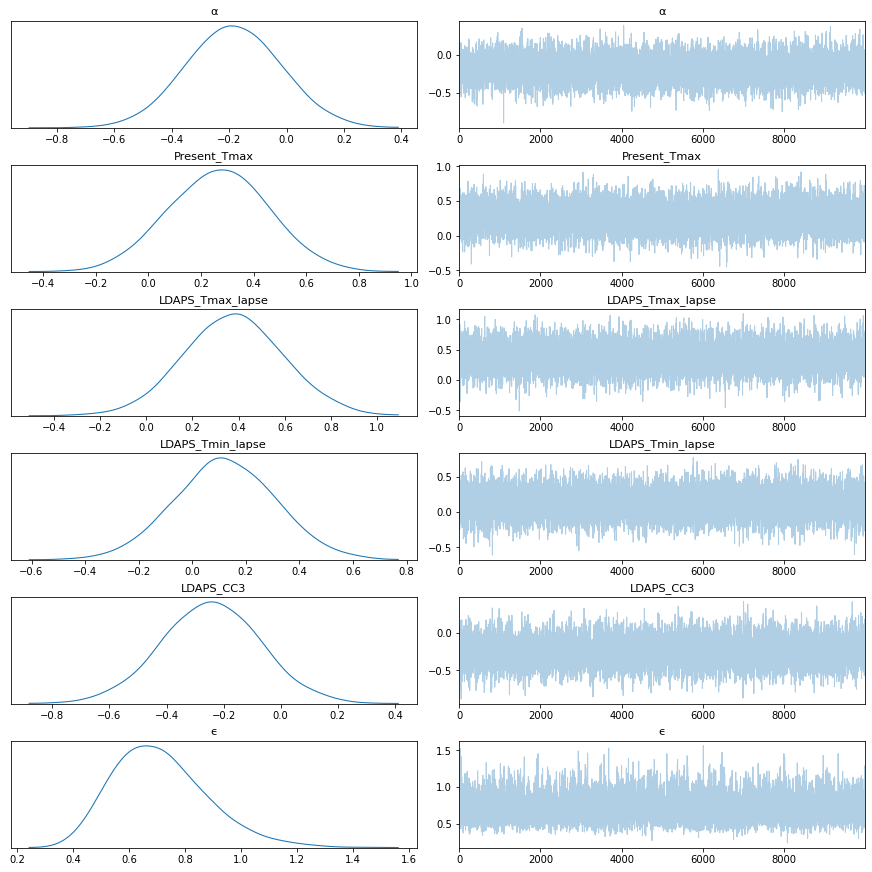

In [117]:
## ADVI
advi=model_vi_s('advi')

for VI


Finished [100%]: Average Loss = 736.06


4
1517
Root mean seure error :  0.35558252161451454
Mean seure error :  0.1264389296777367
R2-score :  0.7384179915286821
Adjusted R2-score :  0.7377259756332555


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

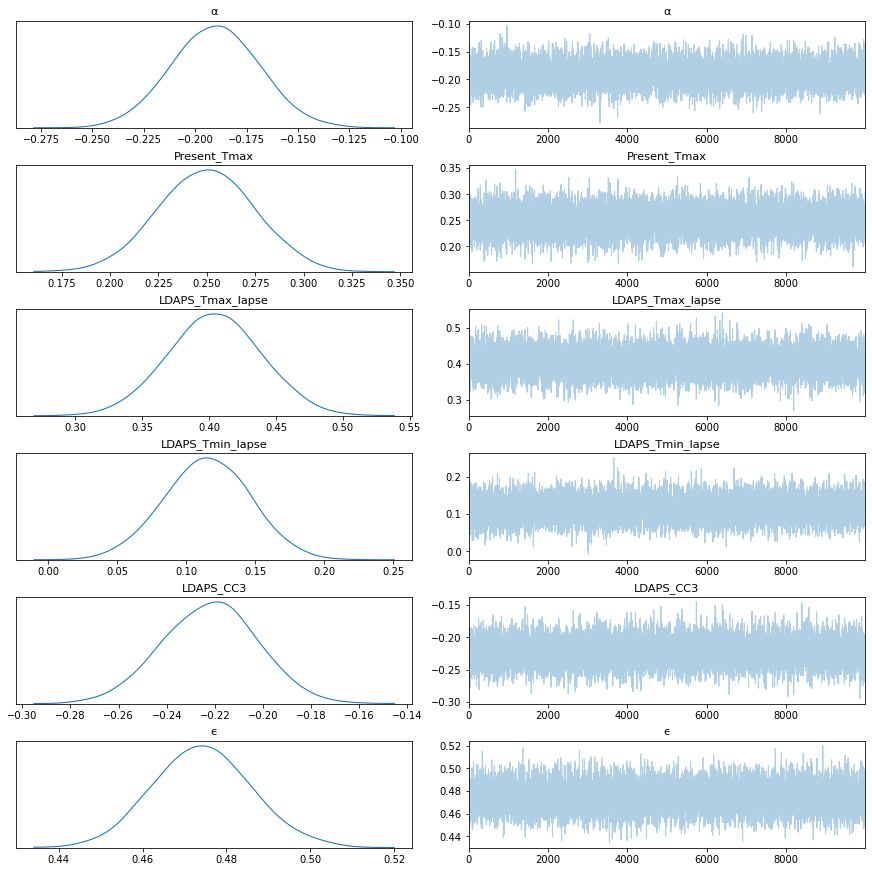

In [118]:
## fullrank advi
fr_advi=model_vi_s('fullrank_advi')

for VI


4
1517
Root mean seure error :  0.3537839788457319
Mean seure error :  0.12516310368791728
R2-score :  0.7410574723098584
Adjusted R2-score :  0.740372439167821


arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNING - Shape validation failed: input_shape: (1, 10000), minimum_shape: (chains=2, draws=4)
arviz.stats.stats_utils - WARNIN

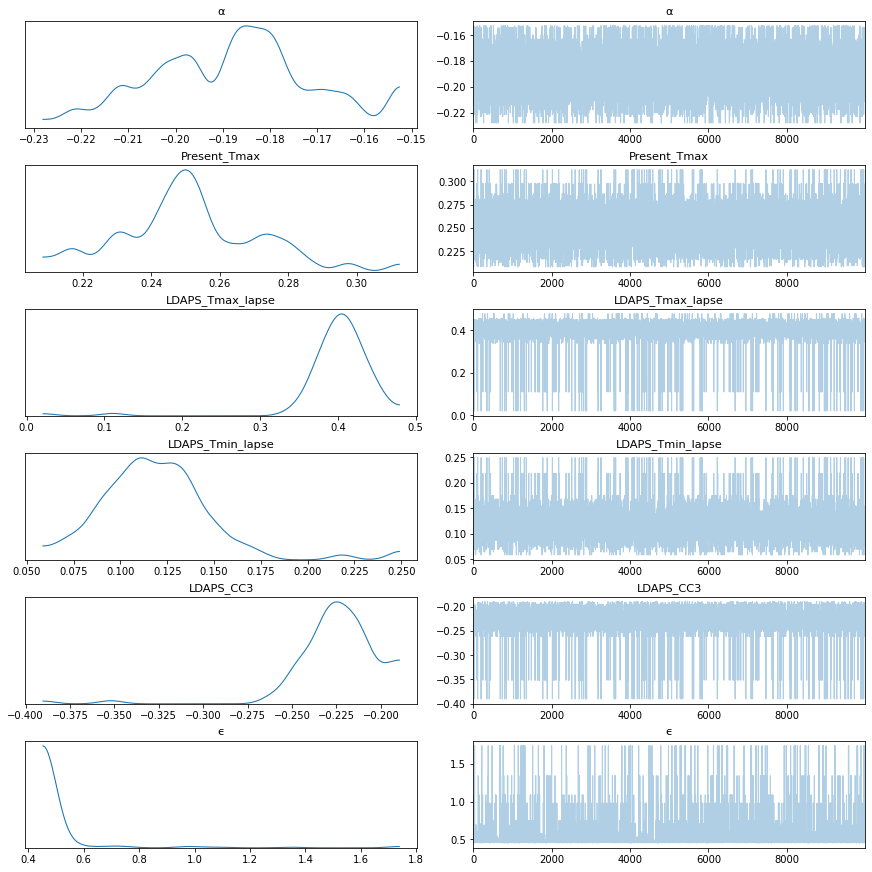

In [119]:
## svgd
svgd= model_vi_s('svgd')

### Results have imporved greatly on using standard scaled data

## Making a fucntion for scaled MCMC methods 

In [121]:
def model_mcmc_s(sampling):

    with pm.Model() as model_mlr:
        
    
           # Priors
        α = pm.Normal('α', mu=0, sd=1) # Try changing the prior distribution

        β_Present_Tmax = pm.Normal('Present_Tmax', mu=0, sd=1)
        β_LDAPS_Tmax_lapse = pm.Normal('LDAPS_Tmax_lapse', mu=0, sd=1)
        β_LDAPS_Tmin_lapse = pm.Normal('LDAPS_Tmin_lapse', mu=0, sd=1)
        CO = pm.Normal('LDAPS_CC3', mu=0., sd=1)

        ϵ = pm.HalfCauchy('ϵ', 5)

        μ = α + Xs_Present_Tmax_train_v*β_Present_Tmax + Xs_LDAPS_Tmax_lapse_train_v*β_LDAPS_Tmax_lapse + Xs_LDAPS_Tmin_lapse_train_v*β_LDAPS_Tmin_lapse + Xs_LDAPS_CC3_train_v*CO

        # likelihood

        y_pred = pm.Normal('y_pred', mu=μ, sd=ϵ, observed=ysv_train)

#         step = pm.Slice()
        
        if sampling == 'HMC':
            step = pm.HamiltonianMC()
            
        elif sampling == 'metropolis':
            step = pm.Metropolis()
            
        elif sampling == 'slice':
            step = pm.Slice()
            
        elif sampling == 'NUTS':
            step = pm.NUTS()
        

        trace = pm.sample(10000,step, tune=1000)


    #     trace = pm.sample(10000, tune=1000)


    ## Finding the paramters from the  drawn samples

    alpha=trace['α'].mean()
    beta_Present_Tmax=trace['Present_Tmax'].mean()
    beta_LDAPS_Tmax_lapse=trace['LDAPS_Tmax_lapse'].mean()
    beta_LDAPS_Tmin_lapse=trace['LDAPS_Tmin_lapse'].mean()
    beta_LDAPS_CC3=trace['LDAPS_CC3'].mean()



    # Predicted y oytput
    y_p = alpha + beta_Present_Tmax*Xs_Present_Tmax_test + beta_LDAPS_Tmax_lapse*Xs_LDAPS_Tmax_lapse_test+ beta_LDAPS_Tmin_lapse*Xs_LDAPS_Tmin_lapse_test+ beta_LDAPS_CC3*Xs_LDAPS_CC3_test


    ## Evaluating reults
    p= len(X.columns)
    print(p)
    n= len(X.index)
    print(n)

    rmse = mean_squared_error(ysv_test, y_p, squared=False)
    print('Root mean square error : ',rmse)
    mse = mean_squared_error(ys_test, y_p)
    print('Mean square error : ',mse)
    r2= r2_score(ys_test, y_p)
    print('R2-score : ',r2)
    Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
    print('Adjusted R2-score : ',Adj_r2)

    
    global df_results_r1


    df_results_r1= df_results_r1.append({'model_name':str(sampling)+' MLR-train/test datastet',
                                        'sampling/VI_method':sampling,'RMSE':rmse,'MSE':mse,'R2':r2,
                                    'Adj_R2':Adj_r2,'model_details':model_mlr},ignore_index=True)

    az.summary(trace)

    pm.traceplot(trace)
    print(pm.summary(trace))
    return(model_mlr)

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ϵ, LDAPS_CC3, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 16 seconds.


4
1517
Root mean square error :  0.35359843375973654
Mean square error :  0.1250318523573388
R2-score :  0.7413290104093564
Adjusted R2-score :  0.7406446956220796
                  mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                -0.19 0.02   -0.23    -0.15       0.00     0.00  29385.00   
Present_Tmax      0.25 0.02    0.21     0.29       0.00     0.00  31616.00   
LDAPS_Tmax_lapse  0.41 0.03    0.35     0.47       0.00     0.00  28623.00   
LDAPS_Tmin_lapse  0.12 0.03    0.06     0.17       0.00     0.00  27149.00   
LDAPS_CC3        -0.22 0.02   -0.26    -0.19       0.00     0.00  29620.00   
ϵ                 0.47 0.01    0.46     0.49       0.00     0.00  38251.00   

                   ess_sd  ess_bulk  ess_tail  r_hat  
α                29227.00  29401.00  30305.00   1.00  
Present_Tmax     31616.00  31625.00  30373.00   1.00  
LDAPS_Tmax_lapse 28426.00  28630.00  26677.00   1.00  
LDAPS_Tmin_lapse 26895.00  27144.00  28268.00   1.00  
LDAPS_CC3     

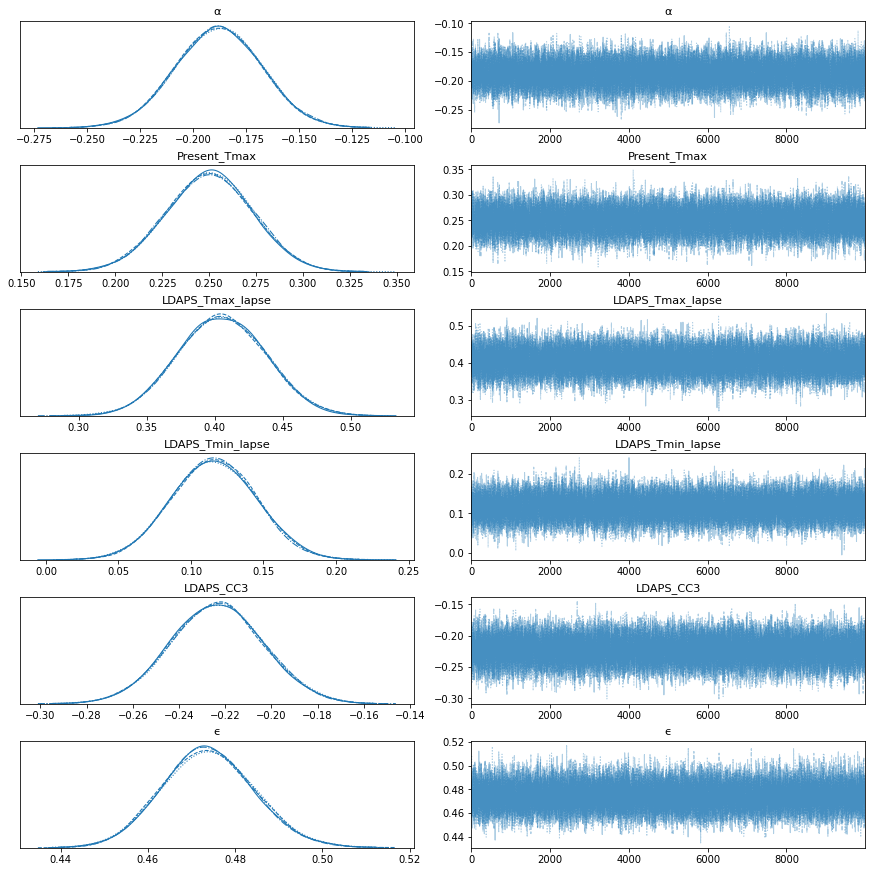

In [122]:
nuts_s=model_mcmc_s('NUTS')

Multiprocess sampling (4 chains in 4 jobs)
HamiltonianMC: [ϵ, LDAPS_CC3, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmax, α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 12 seconds.
The acceptance probability does not match the target. It is 0.763979544310086, but should be close to 0.65. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.829428614703148, but should be close to 0.65. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.7656873657939112, but should be close to 0.65. Try to increase the number of tuning steps.


4
1517
Root mean square error :  0.35372435223338977
Mean square error :  0.12512091736293118
R2-score :  0.7411447490975378
Adjusted R2-score :  0.7404599468464731
                  mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                -0.19 0.02   -0.23    -0.15       0.00     0.00  12831.00   
Present_Tmax      0.25 0.02    0.21     0.29       0.00     0.00  15487.00   
LDAPS_Tmax_lapse  0.41 0.03    0.35     0.46       0.00     0.00  12390.00   
LDAPS_Tmin_lapse  0.12 0.03    0.06     0.17       0.00     0.00  10714.00   
LDAPS_CC3        -0.22 0.02   -0.26    -0.19       0.00     0.00  13672.00   
ϵ                 0.47 0.01    0.45     0.49       0.00     0.00  28495.00   

                   ess_sd  ess_bulk  ess_tail  r_hat  
α                12793.00  12835.00  18787.00   1.00  
Present_Tmax     15487.00  15484.00  22115.00   1.00  
LDAPS_Tmax_lapse 12390.00  12386.00  18925.00   1.00  
LDAPS_Tmin_lapse 10714.00  10713.00  17228.00   1.00  
LDAPS_CC3    

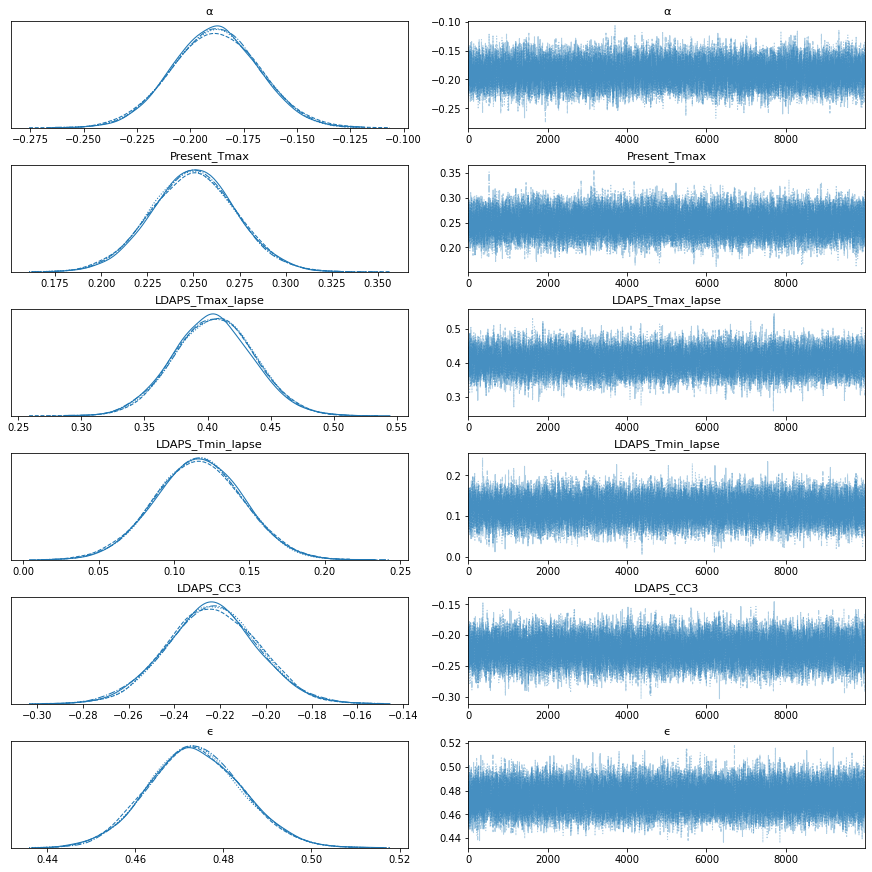

In [123]:
hmc_s=model_mcmc_s('HMC')

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [ϵ]
>Metropolis: [LDAPS_CC3]
>Metropolis: [LDAPS_Tmin_lapse]
>Metropolis: [LDAPS_Tmax_lapse]
>Metropolis: [Present_Tmax]
>Metropolis: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 13 seconds.
The number of effective samples is smaller than 10% for some parameters.


4
1517
Root mean square error :  0.3536431264169805
Mean square error :  0.12506346086197642
R2-score :  0.7412636174473235
Adjusted R2-score :  0.7405791296627926
                  mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                -0.19 0.02   -0.23    -0.15       0.00     0.00   1808.00   
Present_Tmax      0.25 0.02    0.21     0.29       0.00     0.00   2048.00   
LDAPS_Tmax_lapse  0.40 0.03    0.34     0.46       0.00     0.00    961.00   
LDAPS_Tmin_lapse  0.12 0.03    0.07     0.17       0.00     0.00   1474.00   
LDAPS_CC3        -0.22 0.02   -0.26    -0.19       0.00     0.00   1124.00   
ϵ                 0.47 0.01    0.46     0.49       0.00     0.00   5022.00   

                  ess_sd  ess_bulk  ess_tail  r_hat  
α                1802.00   1807.00   2739.00   1.00  
Present_Tmax     2048.00   2050.00   3343.00   1.00  
LDAPS_Tmax_lapse  961.00    966.00   1603.00   1.00  
LDAPS_Tmin_lapse 1474.00   1479.00   2487.00   1.00  
LDAPS_CC3        11

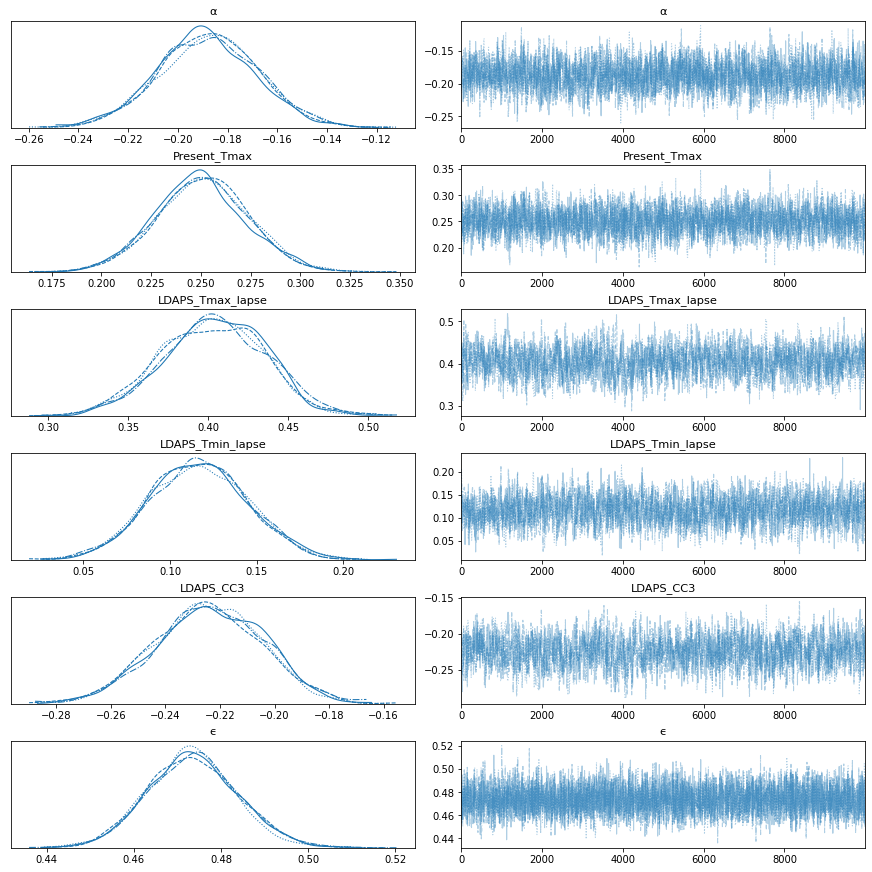

In [124]:
metroplois_s=model_mcmc_s('metropolis')

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Slice: [ϵ]
>Slice: [LDAPS_CC3]
>Slice: [LDAPS_Tmin_lapse]
>Slice: [LDAPS_Tmax_lapse]
>Slice: [Present_Tmax]
>Slice: [α]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 38 seconds.
The number of effective samples is smaller than 25% for some parameters.


4
1517
Root mean square error :  0.3536958077789211
Mean square error :  0.12510072444038353
R2-score :  0.7411865250383052
Adjusted R2-score :  0.7405018333056024
                  mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_mean  \
α                -0.19 0.02   -0.23    -0.15       0.00     0.00  11921.00   
Present_Tmax      0.25 0.02    0.21     0.29       0.00     0.00  14095.00   
LDAPS_Tmax_lapse  0.41 0.03    0.34     0.46       0.00     0.00   9100.00   
LDAPS_Tmin_lapse  0.12 0.03    0.06     0.17       0.00     0.00   9850.00   
LDAPS_CC3        -0.22 0.02   -0.26    -0.19       0.00     0.00  10203.00   
ϵ                 0.47 0.01    0.45     0.49       0.00     0.00  38652.00   

                   ess_sd  ess_bulk  ess_tail  r_hat  
α                11921.00  11923.00  20153.00   1.00  
Present_Tmax     14095.00  14100.00  21610.00   1.00  
LDAPS_Tmax_lapse  9100.00   9101.00  16084.00   1.00  
LDAPS_Tmin_lapse  9850.00   9855.00  17842.00   1.00  
LDAPS_CC3     

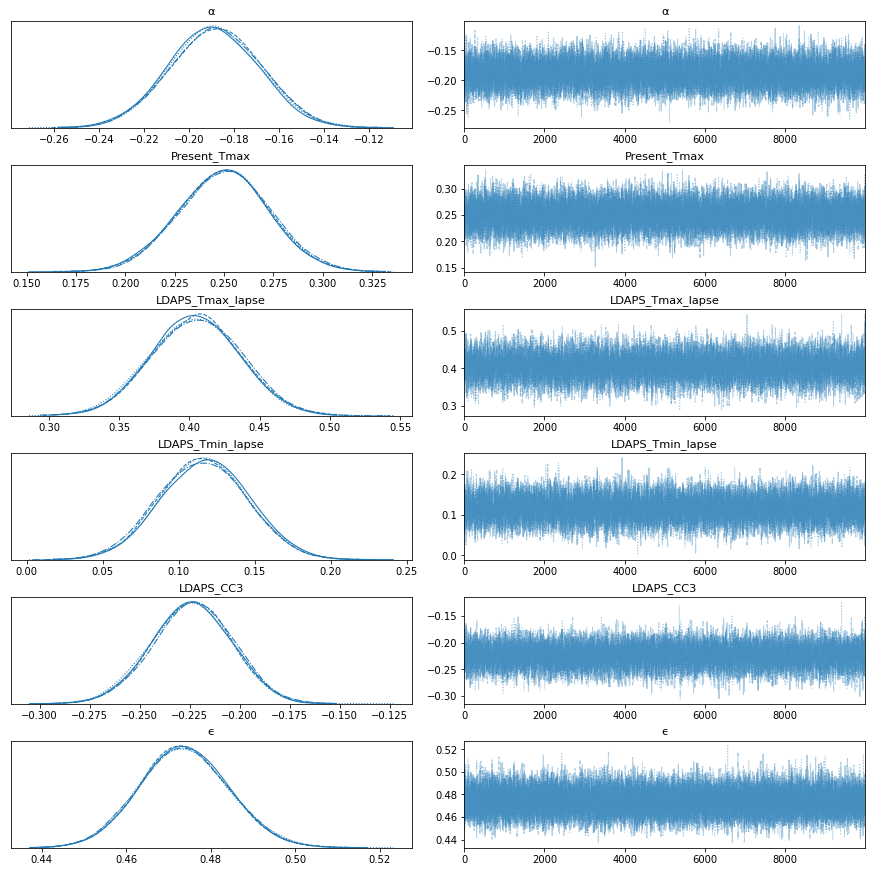

In [126]:
slice_s=model_mcmc_s('slice')

In [127]:
df_results_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
2,MLR-Slice-Full datastet (general priors,Slice,1.48,2.19,0.69,0.69,<pymc3.model.Model object at 0x7f6088606d90>
3,MLR-Slice-Full datastet (Specific priors0,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60892c7590>
4,MLR-Slice-train/test datastet (general priors,Slice,1.36,1.86,0.60,0.60,<pymc3.model.Model object at 0x7f6086c7b890>
5,MLR-Slice-train/test datastet (specific priors,Slice,1.33,1.76,0.62,0.62,<pymc3.model.Model object at 0x7f608809bad0>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>
7,MLR-Robust-Nuts-Full datastet (Specific priors),NUTS,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f60793a7d10>
8,MLR-Robust-Nuts-train/test datastet (general priors,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f60878f97d0>
9,MLR-Robust-Nuts-train/test datastet (specific priors,NUTS,1.31,1.72,0.63,0.63,<pymc3.model.Model object at 0x7f6046704210>


In [128]:
df_results_r1.tail(10)

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
25,fullrank_advi MLR-new-train/test datastet (G),fullrank_advi,21.79,474.91,-100.48,-100.75,<pymc3.model.Model object at 0x7f6042350350>
26,svgd MLR-new-train/test datastet (G),svgd,21.38,456.94,-96.64,-96.90,<pymc3.model.Model object at 0x7f602248b350>
27,advi -train/test datastet (G),advi,0.35,0.12,0.75,0.75,<pymc3.model.Model object at 0x7f60360a23d0>
28,fullrank_advi -train/test datastet (G),fullrank_advi,0.36,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f601e5c4c50>
29,svgd -train/test datastet (G),svgd,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f6039876bd0>
30,asvgd MLR-new-train/test datastet (G),asvgd,24.79,614.72,-130.35,-130.70,<pymc3.model.Model object at 0x7f6079b8e790>
31,NUTS MLR-train/test datastet,NUTS,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f60210d5890>
32,HMC MLR-train/test datastet,HMC,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f60210d5cd0>
33,metropolis MLR-train/test datastet,metropolis,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f601d6db950>
34,slice MLR-train/test datastet,slice,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f601d4c3cd0>


In [129]:
df_reults_r1=df_results_r1.sort_values('Adj_R2',ascending=False)

df_reults_r1

,model_name,sampling/VI_method,RMSE,MSE,R2,Adj_R2,model_details
27,advi -train/test datastet (G),advi,0.35,0.12,0.75,0.75,<pymc3.model.Model object at 0x7f60360a23d0>
0,Linear Regression-Full dataste,NA,1.36,1.84,0.74,0.74,LinearRegression()
31,NUTS MLR-train/test datastet,NUTS,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f60210d5890>
1,Linear Regression-tain/test dataste,NA,1.10,1.21,0.74,0.74,LinearRegression()
33,metropolis MLR-train/test datastet,metropolis,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f601d6db950>
34,slice MLR-train/test datastet,slice,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f601d4c3cd0>
32,HMC MLR-train/test datastet,HMC,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f60210d5cd0>
29,svgd -train/test datastet (G),svgd,0.35,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f6039876bd0>
28,fullrank_advi -train/test datastet (G),fullrank_advi,0.36,0.13,0.74,0.74,<pymc3.model.Model object at 0x7f601e5c4c50>
6,MLR-Robust-Slice-Full datastet (general priors,Slice,1.48,2.18,0.69,0.69,<pymc3.model.Model object at 0x7f6087757e90>


In [130]:
# save the final data
df_results_r1.to_csv('df_results_r2.csv',index=False)

## Conclusion

#### We can see that MCMC nad VI models both perform good on scaled dataset
#### Also we see the performance of MCMC and VI is at par and a bit better than normal Linear Regression
#### NUTS Sampling method and ADVI gave best result.